# Web Development Client Segmentation Analysis



This is just an extension of the order segmentation notebook, except here each data point represents a customer rather than an individual order. This analysis should be straightforward to follow if you're familiar with the order segmentation notebook.

The initial analysis is pretty much the same, only the clustering interpretation and deriving conclusions differ. If you have gone through the order segmentation notebook you are better off skipping the beginning and going right away to clustering and interpretation section.



The initial analysis is pretty much the same, only the clustering interpretation and deriving conclusions differ. If you have gone through the order segmentation notebook you are better off skipping the beginning and going right away to clustering and interpretation section.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sc
import matplotlib as mpl

In [2]:
import itertools

In [3]:
data = pd.read_csv('order_segmentation.csv')

In [4]:
data.head()

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels
0,0,0,52.0,29.12,4,14,5,35.8,5.7,25.9,7.2,0.0,9.5,8.2,7.6,1,frontend_specialists
1,1,1,43.0,20.44,4,18,1,24.4,6.7,5.7,13.6,27.6,13.4,8.7,0.0,3,maintenance_focused
2,2,2,55.0,20.39,5,9,5,14.8,28.3,9.7,0.0,9.0,9.1,9.9,19.1,0,general
3,3,3,68.0,7.82,2,10,4,24.2,21.3,15.3,9.6,11.2,6.8,0.0,11.6,0,general
4,4,4,41.0,29.15,7,18,2,18.9,21.9,10.9,9.1,16.0,4.3,11.2,7.6,0,general


In [5]:
data.describe()

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class
count,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000
mean,13999.500000,13999.500000,45.048679,15.075732,4.008143,14.519500,3.986179,19.965500,19.979136,10.030432,9.993879,10.059446,10.005171,10.011154,9.955761,0.293071
std,8083.048105,8083.048105,14.918011,7.793761,2.000055,4.046849,1.997674,6.432955,6.449882,6.008863,6.024026,6.002212,6.031447,6.009234,5.998213,1.144371
min,0.000000,0.000000,5.000000,0.000000,1.000000,8.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6999.750000,6999.750000,35.000000,9.550000,2.000000,11.000000,2.000000,15.700000,15.700000,5.700000,5.600000,5.700000,5.600000,5.600000,5.600000,0.000000
50%,13999.500000,13999.500000,45.000000,15.010000,4.000000,15.000000,4.000000,19.800000,19.800000,9.900000,9.900000,10.000000,9.900000,9.900000,9.800000,0.000000
75%,20999.250000,20999.250000,55.000000,20.430000,6.000000,18.000000,6.000000,24.100000,24.100000,14.000000,14.100000,14.100000,14.100000,14.000000,14.000000,0.000000
max,27999.000000,27999.000000,100.000000,40.000000,7.000000,21.000000,7.000000,58.700000,66.100000,37.100000,37.800000,36.200000,46.200000,44.000000,39.600000,5.000000


In [6]:
data[data['discount%']<0].sort_values(by='discount%', ascending=True)

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels


### Selecting samples

In [7]:
indices = [56,294,1024,10345,18995,567,5678]
data.iloc[indices, :]

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels
56,56,56,32.0,26.76,1,11,3,27.5,17.9,3.0,0.0,14.1,19.9,14.3,3.3,0,general
294,294,294,50.0,16.25,7,12,5,12.5,26.2,16.5,9.1,9.0,11.2,10.1,5.4,0,general
1024,1024,1024,71.0,13.13,4,13,3,20.1,23.1,8.4,5.3,12.3,19.4,2.6,8.8,0,general
10345,10345,10345,35.0,8.79,2,8,7,29.2,13.0,22.8,10.4,10.6,5.2,6.8,2.0,0,general
18995,18995,18995,44.0,13.44,3,21,4,20.5,12.9,12.3,15.3,1.0,12.1,6.0,19.9,0,general
567,567,567,30.0,2.40,6,18,1,19.0,24.7,5.7,7.1,13.7,5.2,10.7,13.9,0,general
5678,5678,5678,50.0,27.04,7,17,2,23.6,19.1,15.4,0.0,3.2,1.6,20.8,16.4,5,consultants


In [8]:
no_orders = data['customer'].value_counts()

In [9]:
for i in range(data.shape[0]):
    data.loc[i, 'num_orders'] = no_orders[data.loc[i, 'customer']]

In [10]:
data.describe()

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,num_orders
count,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.0
mean,13999.500000,13999.500000,45.048679,15.075732,4.008143,14.519500,3.986179,19.965500,19.979136,10.030432,9.993879,10.059446,10.005171,10.011154,9.955761,0.293071,1.0
std,8083.048105,8083.048105,14.918011,7.793761,2.000055,4.046849,1.997674,6.432955,6.449882,6.008863,6.024026,6.002212,6.031447,6.009234,5.998213,1.144371,0.0
min,0.000000,0.000000,5.000000,0.000000,1.000000,8.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0
25%,6999.750000,6999.750000,35.000000,9.550000,2.000000,11.000000,2.000000,15.700000,15.700000,5.700000,5.600000,5.700000,5.600000,5.600000,5.600000,0.000000,1.0
50%,13999.500000,13999.500000,45.000000,15.010000,4.000000,15.000000,4.000000,19.800000,19.800000,9.900000,9.900000,10.000000,9.900000,9.900000,9.800000,0.000000,1.0
75%,20999.250000,20999.250000,55.000000,20.430000,6.000000,18.000000,6.000000,24.100000,24.100000,14.000000,14.100000,14.100000,14.100000,14.000000,14.000000,0.000000,1.0
max,27999.000000,27999.000000,100.000000,40.000000,7.000000,21.000000,7.000000,58.700000,66.100000,37.100000,37.800000,36.200000,46.200000,44.000000,39.600000,5.000000,1.0


In [11]:
frame = data.drop_duplicates('customer')

In [12]:
frame = frame.set_index('customer')

We are replacing Frontend%, Backend% etc. of customers with the average among all the orders and adding an extra feature called number_orders.

In [13]:
customer_avg = data[['total_hours','discount%','Frontend%','Backend%','UI/UX%','DevOps%','Maintenance%','Testing%','Consulting%','Security%','customer']].groupby('customer').mean()

In [14]:
frame[['total_items','discount%','Frontend%','Backend%','UI/UX%','DevOps%','Maintenance%','Testing%','Consulting%','Security%']] = customer_avg

In [15]:
frame.head()

,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels,num_orders,total_items
customer,,,,,,,,,,,,,,,,,,
0,0,52.0,29.12,4,14,5,35.8,5.7,25.9,7.2,0.0,9.5,8.2,7.6,1,frontend_specialists,1.0,52.0
1,1,43.0,20.44,4,18,1,24.4,6.7,5.7,13.6,27.6,13.4,8.7,0.0,3,maintenance_focused,1.0,43.0
2,2,55.0,20.39,5,9,5,14.8,28.3,9.7,0.0,9.0,9.1,9.9,19.1,0,general,1.0,55.0
3,3,68.0,7.82,2,10,4,24.2,21.3,15.3,9.6,11.2,6.8,0.0,11.6,0,general,1.0,68.0
4,4,41.0,29.15,7,18,2,18.9,21.9,10.9,9.1,16.0,4.3,11.2,7.6,0,general,1.0,41.0


### Order Segmentation

let's try and find if there are any natural groupings among our web development clients based on their project characteristics and behaviors.

There may not be any relevant information in the hour in which projects were initiated, but the weekday patterns might reveal insights about client availability and project scheduling preferences.

Let's remove project, hour and weekday features from the data

In [16]:
df = frame.drop(['project', 'hour', 'weekday'], axis=1)

Let's try and do pca and t-sne of the features and see the explained variance and plots

In [17]:
from sklearn.decomposition import PCA

In [18]:
df_numeric = df.drop('labels', axis=1)


In [19]:
pca = PCA(n_components=11)
pca_result = pca.fit_transform(df_numeric)

In [20]:
def pca_results(pca, df):
    dimensions = ['dimention {}'.format(i) for i in range(1,pca.n_components_+1)]
    fig, ax = plt.subplots(figsize=(18,12))
    components = pd.DataFrame(pca.components_)
    components.plot(ax=ax, kind='bar');
    labels = [str(s) for s in df.columns]
    ax.legend(labels)
    ax.set_ylabel('Feature Weights')
    ax.set_xticklabels(dimensions, rotation=90)
    for i, ev in enumerate(np.round(pca.explained_variance_ratio_, 3)):
        ax.text(i-0.04, ax.get_ylim()[1]+0.05, ev)
    plt.show()

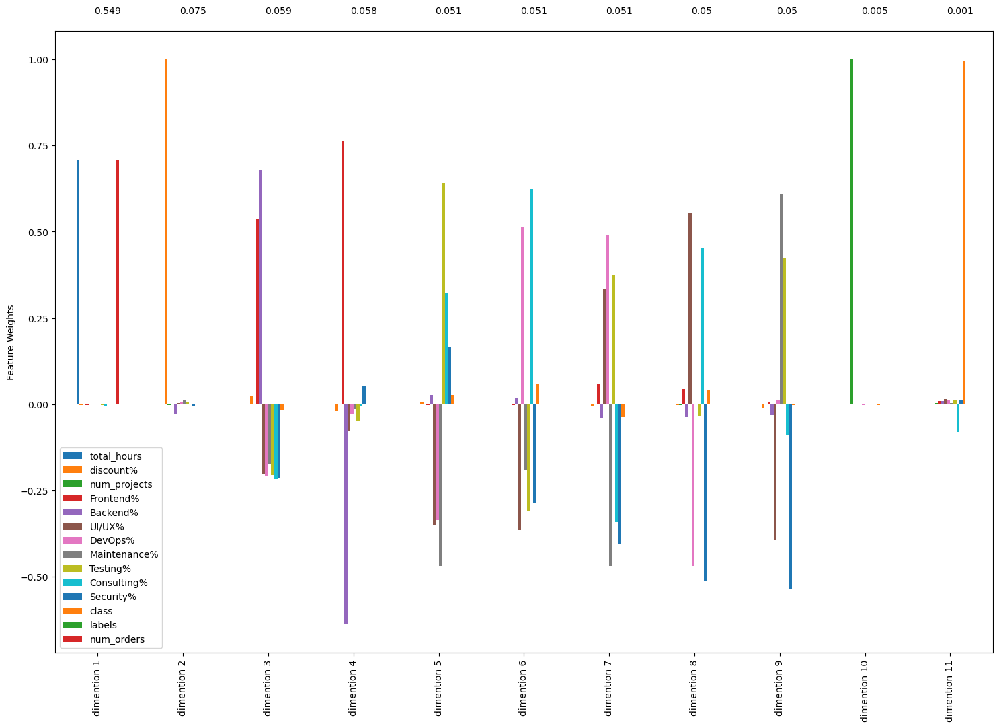

In [21]:
pca_results(pca, df)

In [22]:
def pca_2d_plot(pca, df):
    fig, ax = plt.subplots(figsize=(10,10))
    transformed_data = pca.transform(df.values)
    ax.scatter(transformed_data[:,0], transformed_data[:,1], s=3)
    plt.show()

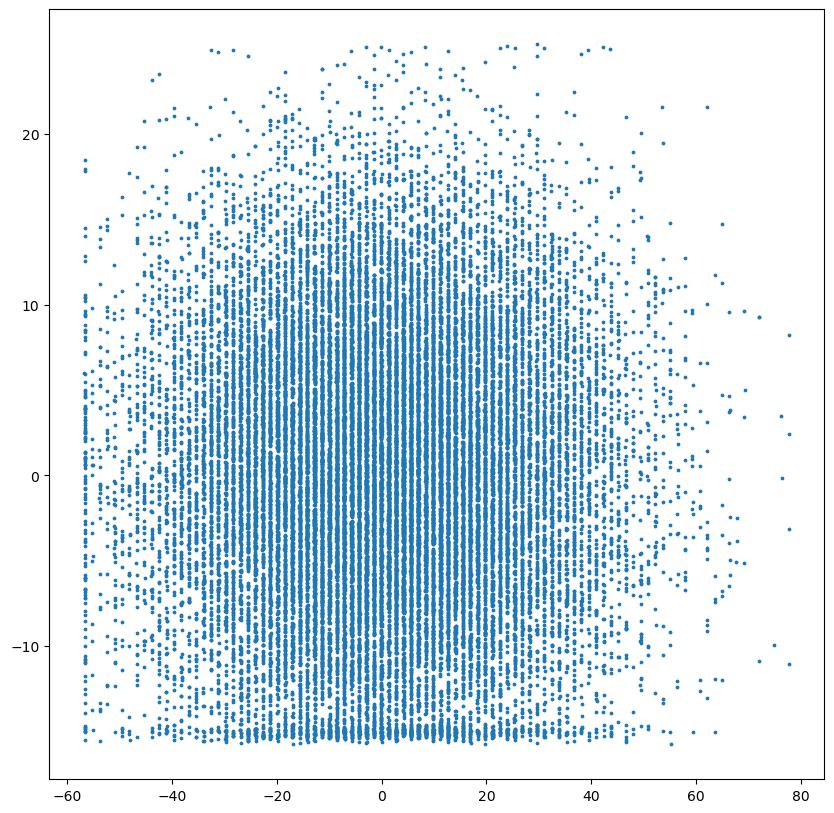

In [23]:
# Remove all non-numeric columns explicitly
df_numeric = df.select_dtypes(include=['float64', 'int64'])

# Refit PCA with numeric columns only
pca = PCA(n_components=11)
pca_result = pca.fit_transform(df_numeric)

# For plotting
def pca_2d_plot(pca, data):
    fig, ax = plt.subplots(figsize=(10,10))
    transformed_data = pca.transform(data)
    ax.scatter(transformed_data[:,0], transformed_data[:,1], s=3)
    plt.show()

pca_2d_plot(pca, df_numeric)

In [24]:
def pca_2d_plot_arrow(pca, df):
    fig, ax = plt.subplots(figsize=(10,10))
    transformed_data = pca.transform(df.values)
    ax.scatter(transformed_data[:,0], transformed_data[:,1], s=3)
    arrow_tail = (ax.get_xlim()[1]/2, ax.get_ylim()[1]/2)
    arrow_head = []
    for i in range(pca.components_.shape[1]):
        arrow_head.append((pca.components_[0,i], pca.components_[1,i]))
    for i in range(pca.components_.shape[1]):
        ax.arrow(arrow_tail[0], arrow_tail[1], arrow_head[i][0], arrow_head[i][1], fc='k', ec='k')
    plt.show()

<Figure size 2000x2000 with 0 Axes>

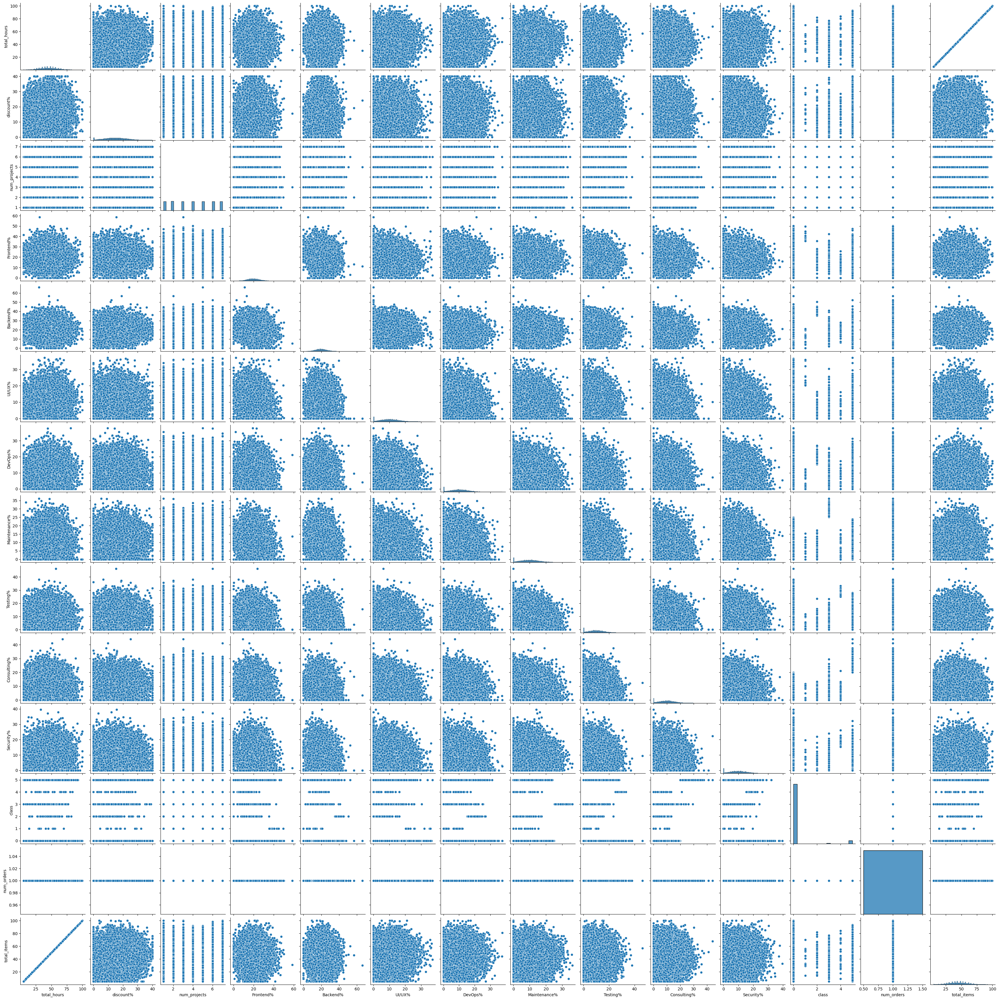

In [25]:
figure = plt.figure(figsize=(20,20))
sns.pairplot(df);
plt.show()

In [26]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression

def dependant_variable_detector(df):
   numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
   
   scaler = StandardScaler()
   lr = LinearRegression()
   
   for col in numeric_cols:
       # Skip if column would create empty DataFrame
       if len(df.drop(col, axis=1).select_dtypes(include=['float64', 'int64']).columns) == 0:
           continue
       
       # Use only numeric columns for independent variables
       X = df.drop(col, axis=1).select_dtypes(include=['float64', 'int64'])
       y = df[col]
       
       X_scaled = scaler.fit_transform(X)
       y_scaled = scaler.fit_transform(y.values.reshape(-1,1))
       
       lr.fit(X_scaled, y_scaled)
       print(f'Using {col} as dependent variable R2 score is: {lr.score(X_scaled, y_scaled)}')

In [27]:
dependant_variable_detector(df)

Using total_hours as dependent variable R2 score is: 1.0
Using discount% as dependent variable R2 score is: 1.642883123731398e-05
Using num_projects as dependent variable R2 score is: 0.00014469316928045206
Using Frontend% as dependent variable R2 score is: 0.9998467982956499
Using Backend% as dependent variable R2 score is: 0.9998476023465472
Using UI/UX% as dependent variable R2 score is: 0.9998243830524348
Using DevOps% as dependent variable R2 score is: 0.9998253179576918
Using Maintenance% as dependent variable R2 score is: 0.9998240234693127
Using Testing% as dependent variable R2 score is: 0.9998257587535159
Using Consulting% as dependent variable R2 score is: 0.9998244533381297
Using Security% as dependent variable R2 score is: 0.9998238411835345
Using class as dependent variable R2 score is: 0.22328674992860098
Using num_orders as dependent variable R2 score is: 1.0
Using total_items as dependent variable R2 score is: 1.0


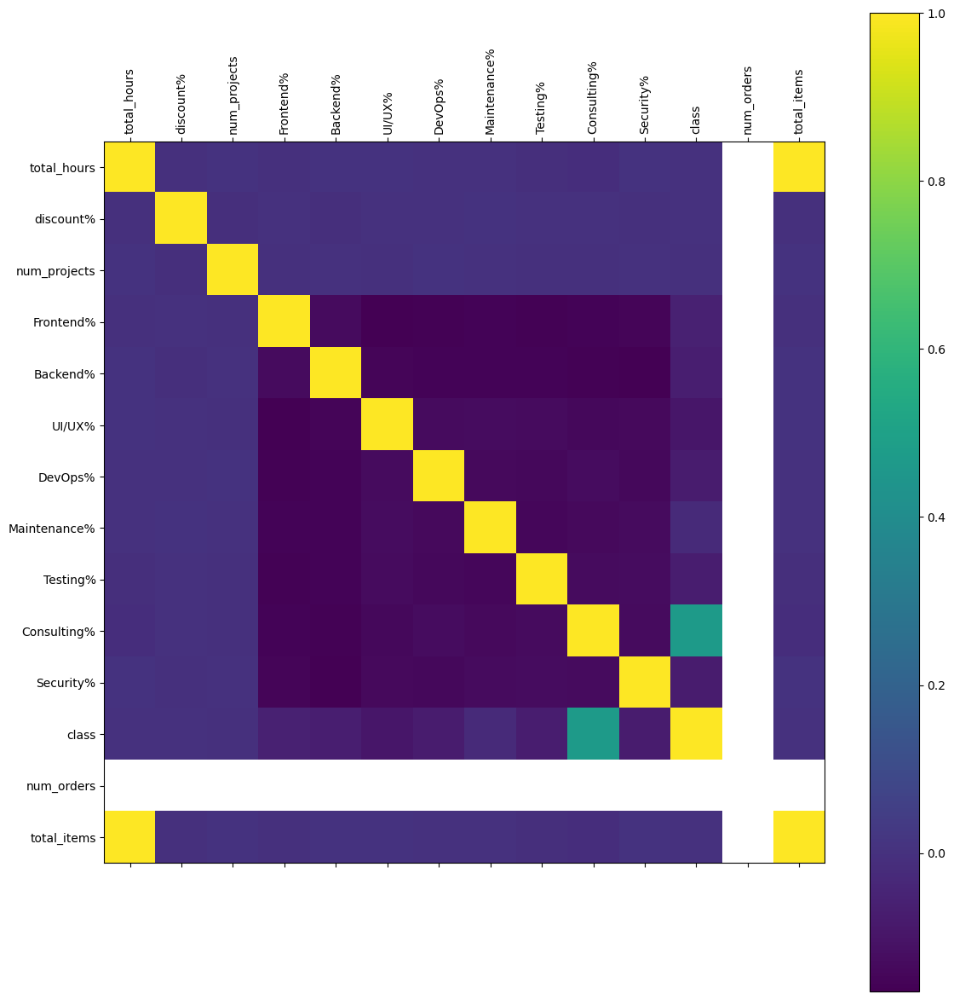

In [28]:
def plot_corr_matrix(df):
    # Select only numeric columns
    df_numeric = df.select_dtypes(include=['float64', 'int64'])
    
    df_corr = df_numeric.corr()
    fig, ax = plt.subplots(figsize=(12,12))
    cax = ax.matshow(df_corr.values, interpolation='nearest')
    fig.colorbar(cax)
    plt.xticks(range(len(df_corr.columns)), df_corr.columns, rotation=90)
    plt.yticks(range(len(df_corr.columns)), df_corr.columns)
    plt.tight_layout()
    plt.show()

plot_corr_matrix(df)

## Outlier detection

C:\Users\macdo\AppData\Local\Temp\ipykernel_18480\1483742675.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['total_items']);


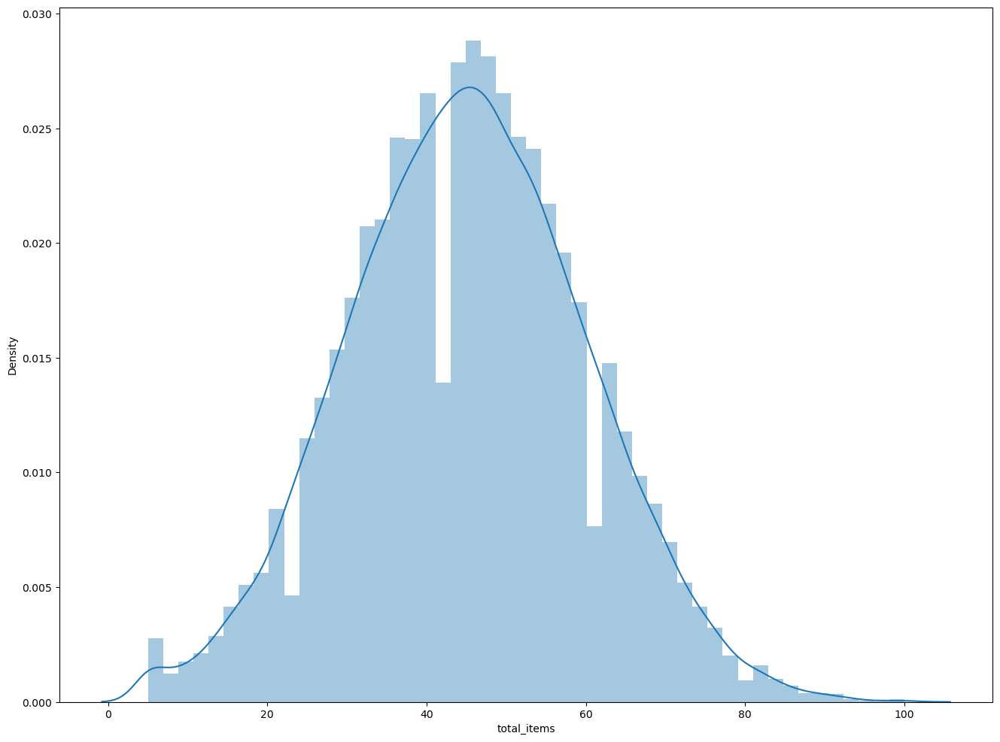

In [29]:
fig = plt.figure(figsize=(16,12))
sns.distplot(df['total_items']);
plt.show()

This distribution definitely has outliers, let's first apply a log transformations

C:\Users\macdo\AppData\Local\Temp\ipykernel_18480\277247732.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['total_items']);


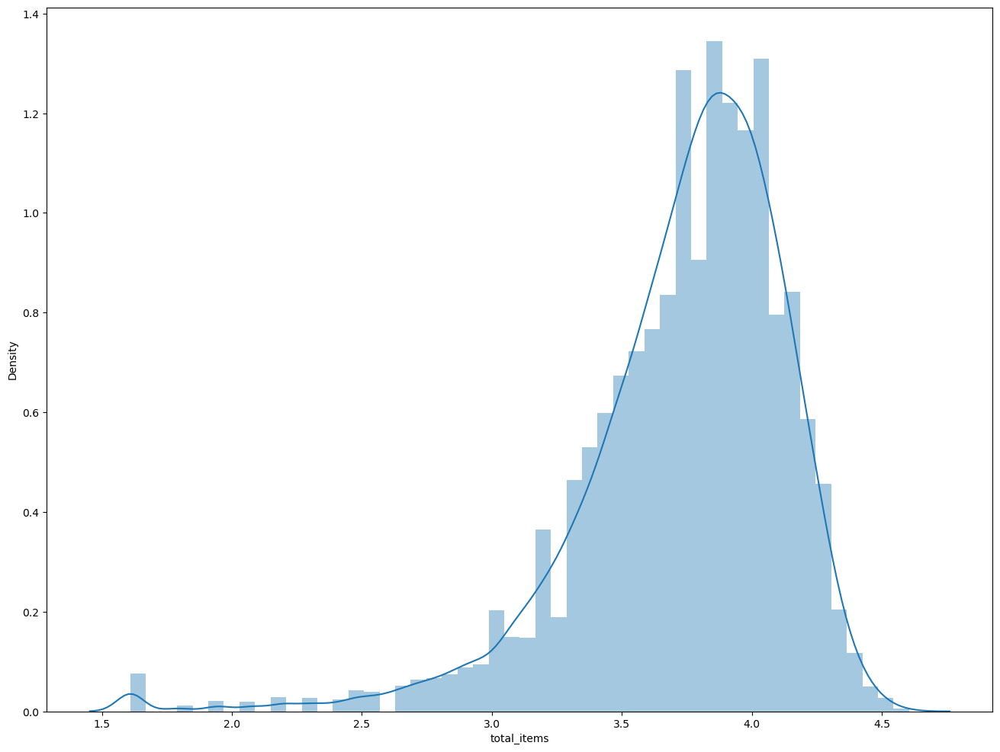

In [30]:
df['total_items'] = np.log(df['total_items'])
fig = plt.figure(figsize=(16,12))
sns.distplot(df['total_items']);
plt.show()

In [31]:
def turkey_outlier_detector(df, cols=None):
    if cols is None:
        cols = df.select_dtypes(include=[np.number]).columns.tolist()
    
    q1 = {}
    q3 = {}
    iqd = {}
    r_limit = {}
    l_limit = {}
    outlier_count = {}
    outlier_indices = {}
    
    for col in cols:
        q1[col] = np.percentile(df[col].values, 25)
        q3[col] = np.percentile(df[col].values, 75)
        iqd[col] = q3[col] - q1[col]
        r_limit[col] = q3[col] + 1.5*iqd[col]
        l_limit[col] = q1[col] - 1.5*iqd[col]
        
        outliers = df[(df[col] < l_limit[col]) | (df[col] > r_limit[col])]
        outlier_count[col] = len(outliers)
        outlier_indices[col] = outliers.index
        
    for col in cols:
        print(f"{col}: {outlier_count[col]} outliers")
        
    return outlier_indices

In [32]:
outlier_indices = turkey_outlier_detector(df)

total_hours: 96 outliers
discount%: 76 outliers
num_projects: 0 outliers
Frontend%: 352 outliers
Backend%: 344 outliers
UI/UX%: 152 outliers
DevOps%: 127 outliers
Maintenance%: 131 outliers
Testing%: 136 outliers
Consulting%: 148 outliers
Security%: 128 outliers
class: 1788 outliers
num_orders: 0 outliers
total_items: 918 outliers


In [33]:
df.drop(outlier_indices['total_items'], inplace=True)

In [34]:
frame.drop(outlier_indices['total_items'], inplace=True)

## Are there clusters in the data, how many clusters?

In [35]:
from sklearn.cluster import KMeans

In [36]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [37]:
# Select only numeric columns
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
X = scaler.fit_transform(df[numeric_columns])

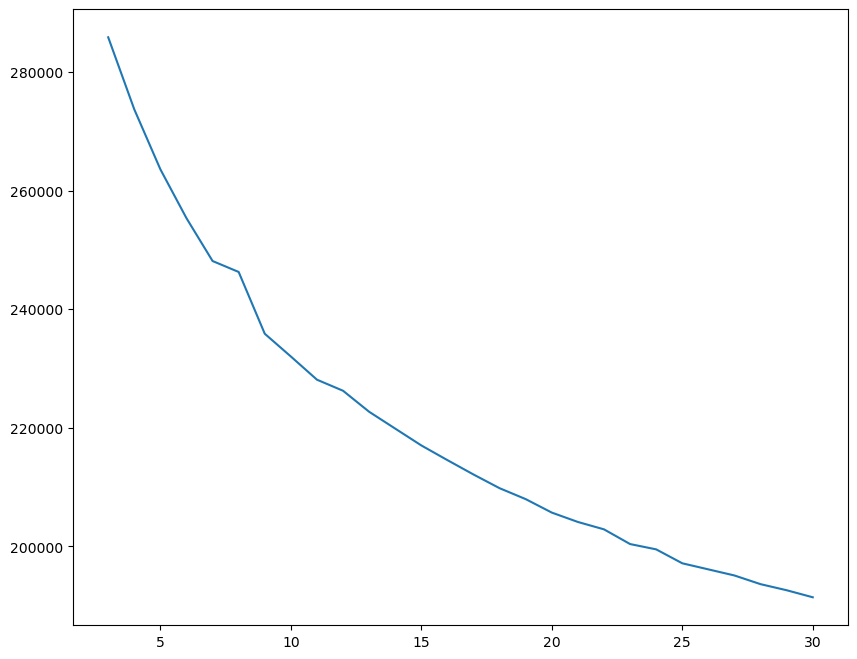

In [38]:
clusters = range(3,31)
inertia = []
for n in clusters:
    kmeans = KMeans(n_clusters=n)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)
    
fig, ax = plt.subplots(figsize=(10,8))
ax.plot(clusters, inertia);
plt.show()

In [39]:
def hopkins_statistic(df):
    from sklearn.neighbors import NearestNeighbors
    from sklearn.preprocessing import StandardScaler
    import numpy as np
    
    # Select only numeric columns
    numeric_df = df.select_dtypes(include=['float64', 'int64'])
    
    n_samples = numeric_df.shape[0]
    num_samples = [int(f*n_samples) for f in [0.25,0.5,0.75]]
    states = [123,42,67,248,654]
    
    for n in num_samples:
        print('-'*12+str(n)+'-'*12)
        hopkins_statistic = []
        for random_state in states:
            data = numeric_df.sample(n=n, random_state=random_state)
            nbrs = NearestNeighbors(n_neighbors=2)
            scaler = StandardScaler()
            X = scaler.fit_transform(data.values)
            nbrs.fit(X)
            sample_dist = nbrs.kneighbors(X)[0][:,1]
            sample_dist = np.sum(sample_dist)
            random_data = np.random.rand(X.shape[0], X.shape[1])
            nbrs.fit(random_data)
            random_dist = nbrs.kneighbors(random_data)[0][:,1]
            random_dist = np.sum(random_dist)
            hs = sample_dist/(sample_dist+random_dist)
            hopkins_statistic.append(hs)
            print('*'*25)
            print('hopkins statistic :'+str(hs))
        print('mean hopkins statistic :'+str(np.mean(np.array(hopkins_statistic))))
        print('hopkins statistic standard deviation :'+str(np.std(np.array(hopkins_statistic))))

In [40]:
hopkins_statistic(df)

------------6770------------
*************************
hopkins statistic :0.7215179145299327
*************************
hopkins statistic :0.721553400250792
*************************
hopkins statistic :0.7219554444326468
*************************
hopkins statistic :0.7213034401450268
*************************
hopkins statistic :0.7229812963873877
mean hopkins statistic :0.7218622991491572
hopkins statistic standard deviation :0.0005978584355633333
------------13541------------
*************************
hopkins statistic :0.7191562846454608
*************************
hopkins statistic :0.7198267834574867
*************************
hopkins statistic :0.7188479190725121
*************************
hopkins statistic :0.7197720428946079
*************************
hopkins statistic :0.7198941366880095
mean hopkins statistic :0.7194994333516155
hopkins statistic standard deviation :0.0004194011609226398
------------20311------------
*************************
hopkins statistic :0.7167244229441786
**

Not a great hopkins statistic score

In [41]:
def kth_nearest_data_point(df, k_max):
    from sklearn.neighbors import NearestNeighbors
    from sklearn.preprocessing import StandardScaler
    import numpy as np
    import matplotlib.pyplot as plt
    
    # Select only numeric columns
    numeric_df = df.select_dtypes(include=['float64', 'int64'])
    
    ks = range(1,k_max+1)
    scaler = StandardScaler()
    X = scaler.fit_transform(numeric_df.values)
    nbrs = NearestNeighbors(n_neighbors=k_max)
    nbrs.fit(X)
    kneighbors_result = nbrs.kneighbors()[0]
    kth_neighbor_dist = list(np.sum(kneighbors_result, axis=0))
    
    fig, ax = plt.subplots(figsize=(12,12))
    ax.plot(ks, kth_neighbor_dist)
    plt.xlabel('k')
    plt.ylabel('Sum of Distances to k-th Nearest Neighbors')
    plt.title('k-Nearest Neighbors Distance')
    plt.show()

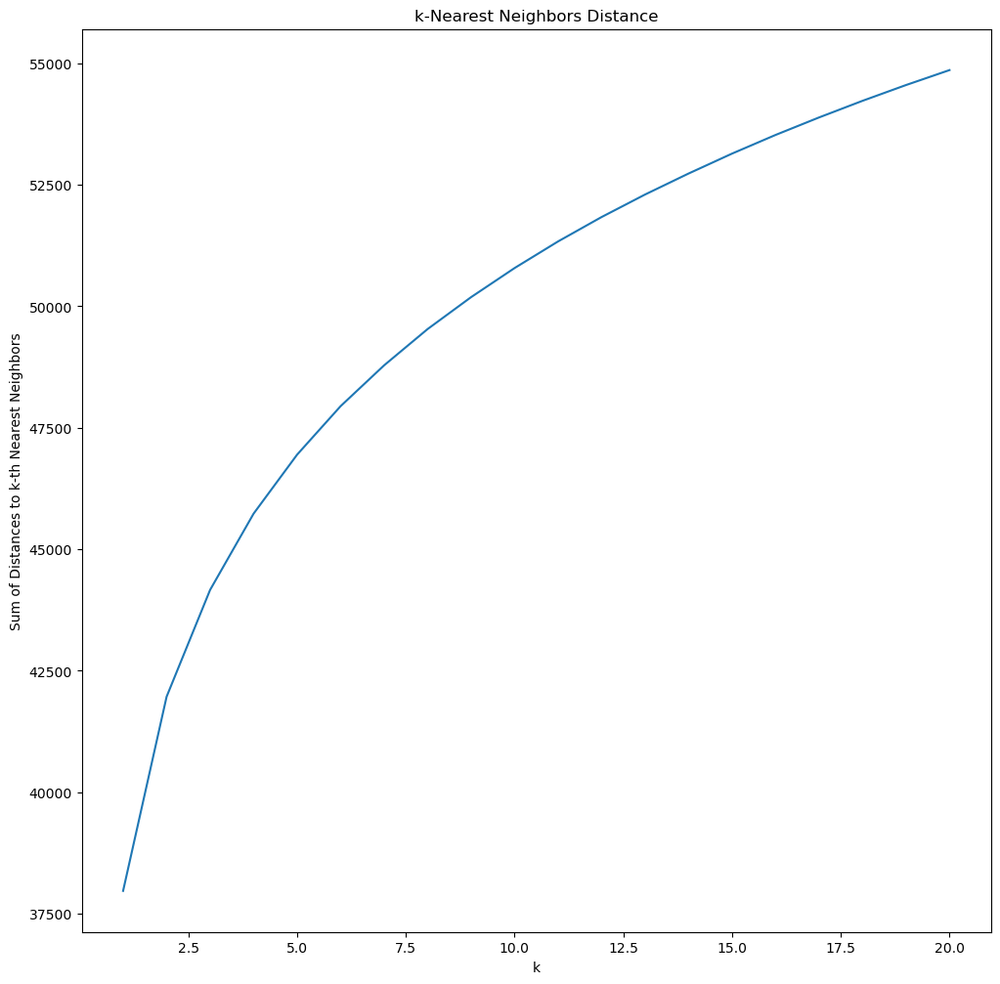

In [42]:
kth_nearest_data_point(df, 20)

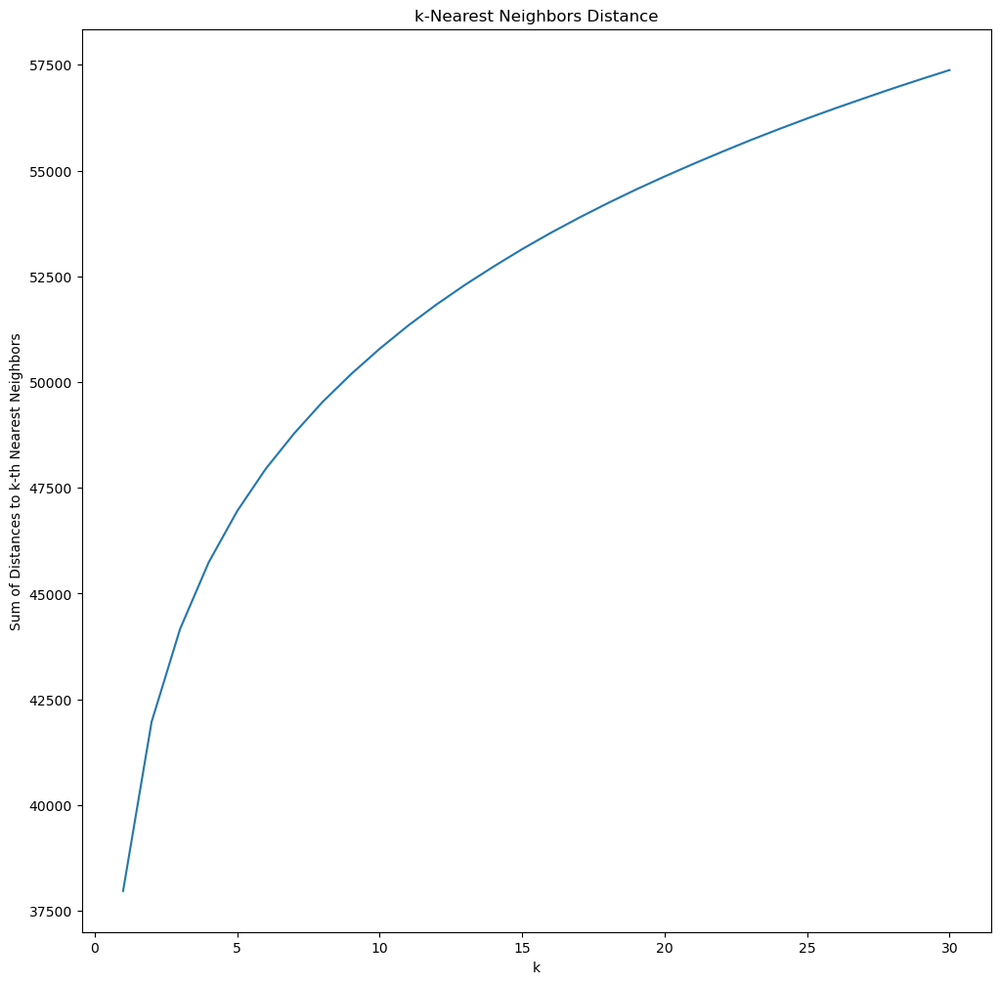

In [43]:
kth_nearest_data_point(df,30)

In [44]:
def plot_silhoutte_score(X, max_clusters=20):
    from sklearn.cluster import KMeans
    from sklearn.metrics import silhouette_score
    num_clusters = range(2,max_clusters+1)
    sil_score = []
    for n in num_clusters:
        kmeans = KMeans(n_clusters=n)
        kmeans.fit(X)
        preds = kmeans.predict(X)
        sil_score.append(silhouette_score(X, preds))
        
    fig, ax = plt.subplots(figsize=(12,12))
    ax.plot(num_clusters, sil_score)
    plt.show()

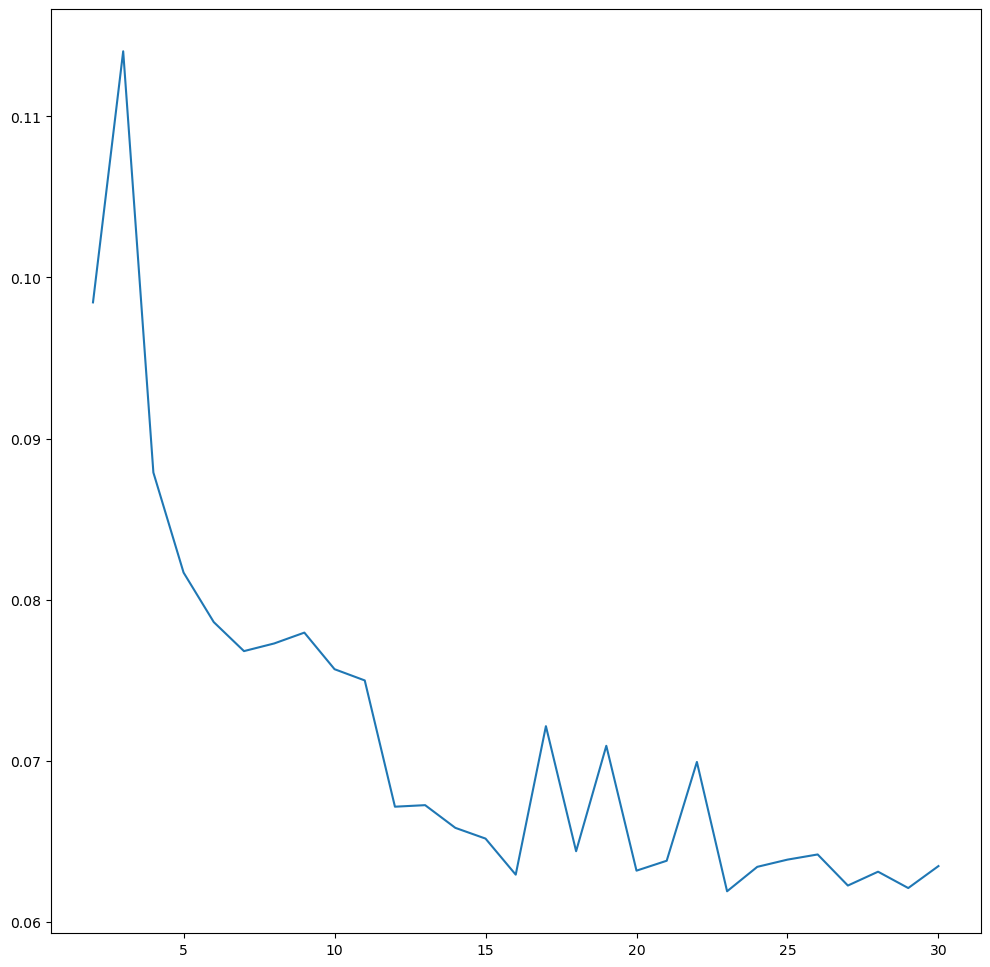

In [45]:
plot_silhoutte_score(X,30)

In [49]:
def ncomponents_of_gmm(X, min_components, max_components):
    from sklearn.mixture import GaussianMixture
    import itertools
    from scipy import linalg
    import matplotlib.pyplot as plt
    import numpy as np

    min_bic = np.inf
    bic = []
    n_components_range = range(min_components, max_components+1)
    cv_types = ['spherical', 'tied', 'diag', 'full']
    best_gmm = None

    for cv_type in cv_types:
        for n_components in n_components_range:
            gmm = GaussianMixture(n_components=n_components, covariance_type=cv_type)
            gmm.fit(X)
            bic.append(gmm.bic(X))
            if bic[-1] < min_bic:
                min_bic = bic[-1]
                best_gmm = gmm
    
    bic = np.array(bic)
    color_iter = itertools.cycle(['navy', 'turquoise', 'cornflowerblue', 'darkorange'])
    clf = best_gmm
    bars = []

    # Plot the BIC scores
    spl = plt.subplot(2, 1, 1)
    for i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):
        xpos = np.array(n_components_range) + .2 * (i - 2)
        bars.append(plt.bar(xpos, bic[i * len(n_components_range):
                                  (i + 1) * len(n_components_range)],
                        width=.2, color=color))
    plt.xticks(n_components_range)
    plt.ylim([bic.min() * 1.01 - .01 * bic.max(), bic.max()])
    plt.title('BIC score per model')
    xpos = np.mod(bic.argmin(), len(n_components_range)) + .65 +\
        .2 * np.floor(bic.argmin() / len(n_components_range))
    plt.text(xpos, bic.min() * 0.97 + .03 * bic.max(), '*', fontsize=14)
    spl.set_xlabel('Number of components')
    spl.legend([b[0] for b in bars], cv_types)

    # Plot the winner
    splot = plt.subplot(2, 1, 2)
    Y_ = clf.predict(X)
    for i, (mean, cov, color) in enumerate(zip(clf.means_, clf.covariances_, color_iter)):
        v, w = linalg.eigh(cov)
        if not np.any(Y_ == i):
            continue
        plt.scatter(X[Y_ == i, 0], X[Y_ == i, 1], .8, color=color)
        
        # Plot an ellipse to show the Gaussian component
        angle = np.arctan2(w[0][1], w[0][0])
        angle = 180. * angle / np.pi  # convert to degrees
        v = 2. * np.sqrt(2.) * np.sqrt(v)
        ell = plt.patches.Ellipse(mean, v[0], v[1], 180. + angle, color=color)
        ell.set_clip_box(splot.bbox)
        ell.set_alpha(.5)
        splot.add_artist(ell)
    
    plt.xticks(())
    plt.yticks(())
    plt.title(f'Selected GMM: {clf.covariance_type} model, {clf.n_components} components')
    plt.subplots_adjust(hspace=.35, bottom=.02)
    plt.show()

    return best_gmm

AttributeError: module 'matplotlib.pyplot' has no attribute 'patches'

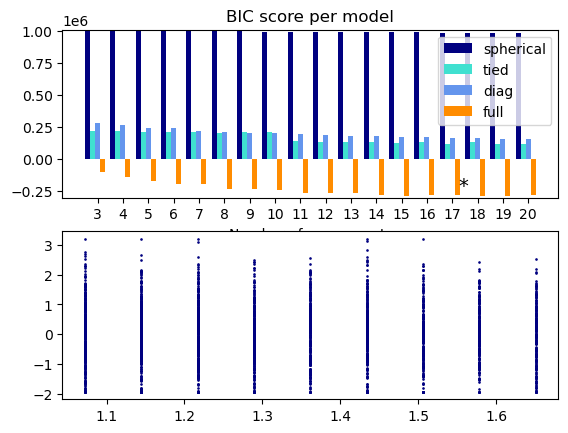

In [50]:
gmm = ncomponents_of_gmm(X, 3, 20)

AttributeError: module 'matplotlib.pyplot' has no attribute 'patches'

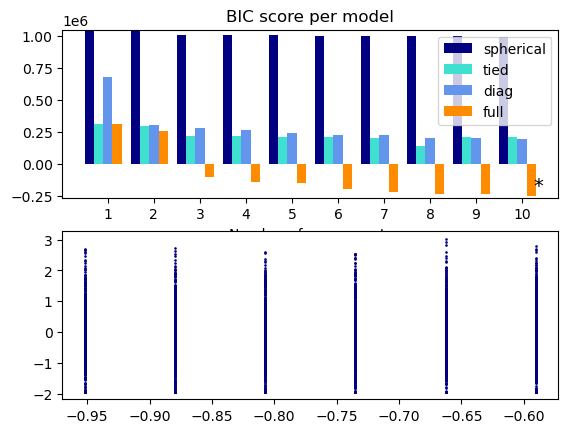

In [52]:
best_model = ncomponents_of_gmm(X, min_components=1, max_components=10)
print(best_model.covariance_type)

AttributeError: module 'matplotlib.pyplot' has no attribute 'patches'

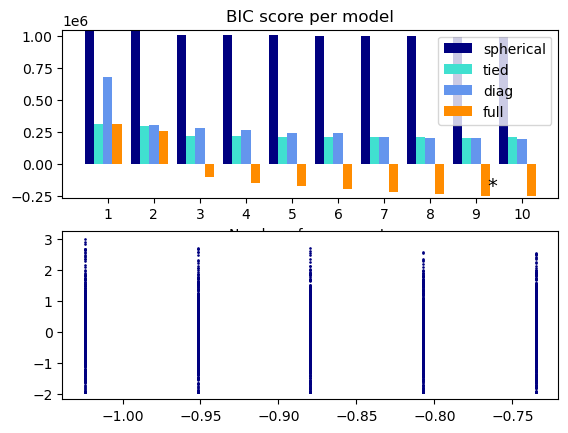

In [54]:
best_model = ncomponents_of_gmm(X, min_components=1, max_components=10)
print(best_model.n_components)

In [57]:
def entropy(df):
    p_df = {}
    for col in df.columns:
        # Compute probabilities only for numeric or categorical columns
        if df[col].dtype in ['float64', 'int64', 'category']:
            p_df[col] = df[col].value_counts(normalize=True)
    
    # Compute entropy for each column and return as a dictionary
    entropies = {}
    for col, probabilities in p_df.items():
        entropies[col] = sc.stats.entropy(probabilities)
    
    return entropies

In [58]:
entropy(df)

{'total_hours': 4.01965801107704,
 'discount%': 7.812452616135811,
 'num_projects': 1.945807691333306,
 'Frontend%': 5.565380309431168,
 'Backend%': 5.566778603880629,
 'UI/UX%': 5.274087638439246,
 'DevOps%': 5.2730692024714125,
 'Maintenance%': 5.282304314975883,
 'Testing%': 5.277504575721959,
 'Consulting%': 5.280413064328994,
 'Security%': 5.270108644900468,
 'class': 0.2802101657000113,
 'num_orders': 0.0,
 'total_items': 4.01965801107704}

In [59]:
def under_partition_measure(X, k_max):
    from sklearn.cluster import KMeans
    ks = range(1,k_max+1)
    UPM = []
    for k in ks:
        kmeans = KMeans(n_clusters=k)
        kmeans.fit(X)
        UPM.append(kmeans.inertia_)
    fig, ax = plt.subplots(figsize=(14,14))
    ax.plot(ks, UPM);
    plt.show()
    return UPM

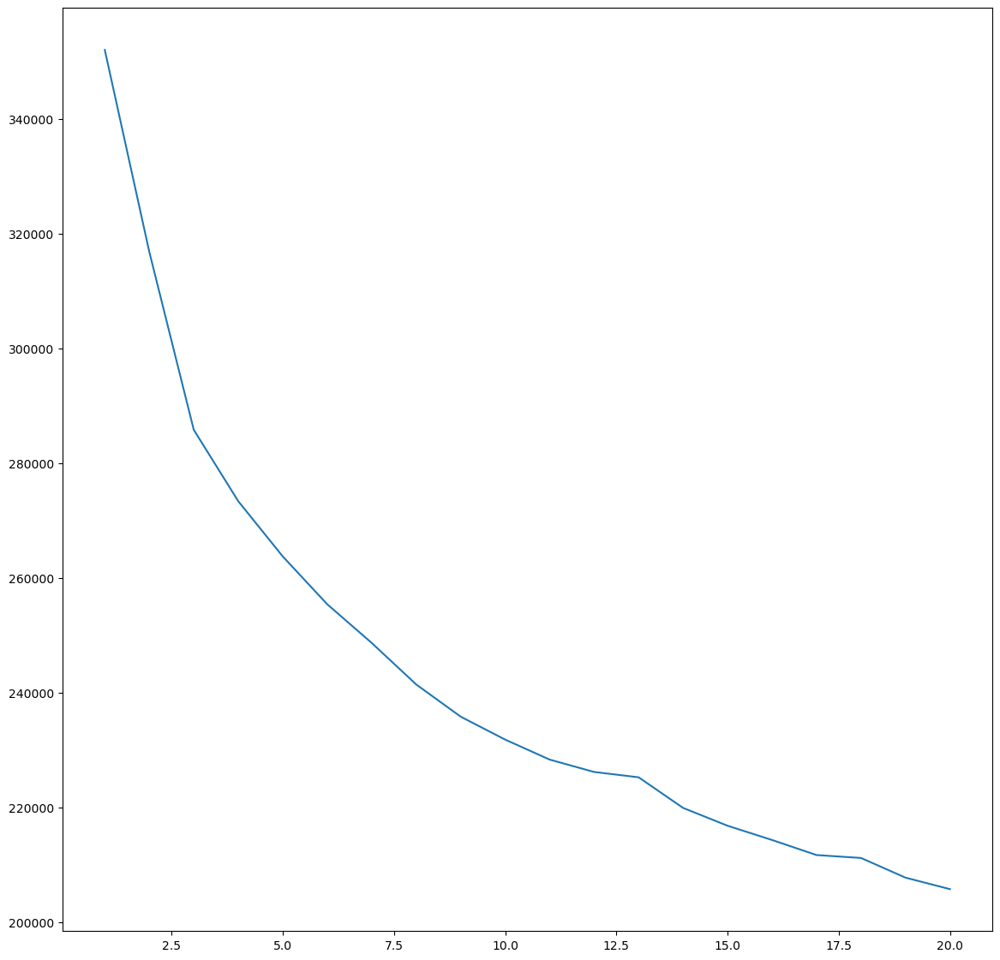

In [60]:
_ = under_partition_measure(X, 20)

In [63]:
def over_partition_measure(X, k_max):
    from sklearn.cluster import KMeans
    from sklearn.metrics.pairwise import pairwise_distances
    import itertools
    import numpy as np
    import matplotlib.pyplot as plt
    
    ks = range(1, k_max+1)
    OPM = []
    
    for k in ks:
        kmeans = KMeans(n_clusters=k, n_init=10)
        kmeans.fit(X)
        centers = kmeans.cluster_centers_
        
        # Find minimum distance between cluster centers
        d_min = np.inf
        for pair in itertools.combinations(centers, 2):
            d = pairwise_distances(pair[0].reshape(1, -1), 
                                   pair[1].reshape(1, -1), 
                                   metric='euclidean')[0][0]
            d_min = min(d, d_min)
        
        OPM.append(k/d_min)
    
    fig, ax = plt.subplots(figsize=(12, 6))
    ax.plot(list(ks), OPM)
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Over-Partition Measure')
    plt.title('Over-Partition Measure vs Number of Clusters')
    plt.show()
    
    return OPM

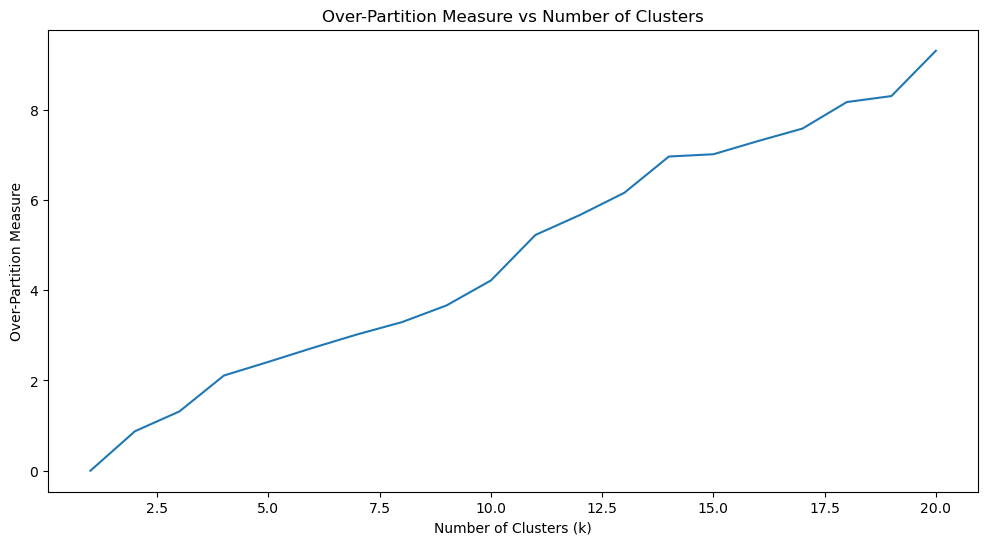

In [64]:
_ = over_partition_measure(X, 20)

In [65]:
def validity_index(X, k_max):
    UPM = under_partition_measure(X, k_max)
    OPM = over_partition_measure(X, k_max)
    UPM_min = np.min(UPM)
    OPM_min = np.min(OPM)
    UPM_max = np.max(UPM)
    OPM_max = np.max(OPM)
    norm_UPM = []
    norm_OPM = []
    for i in range(k_max):
        norm_UPM.append((UPM[i]-UPM_min)/(UPM_max-UPM_min))
        norm_OPM.append((OPM[i]-OPM_min)/(OPM_max-OPM_min))
        
    validity_index = np.array(norm_UPM)+np.array(norm_OPM)
    fig, ax = plt.subplots(figsize=(12,12))
    ax.plot(range(1,k_max+1), validity_index)
    return validity_index

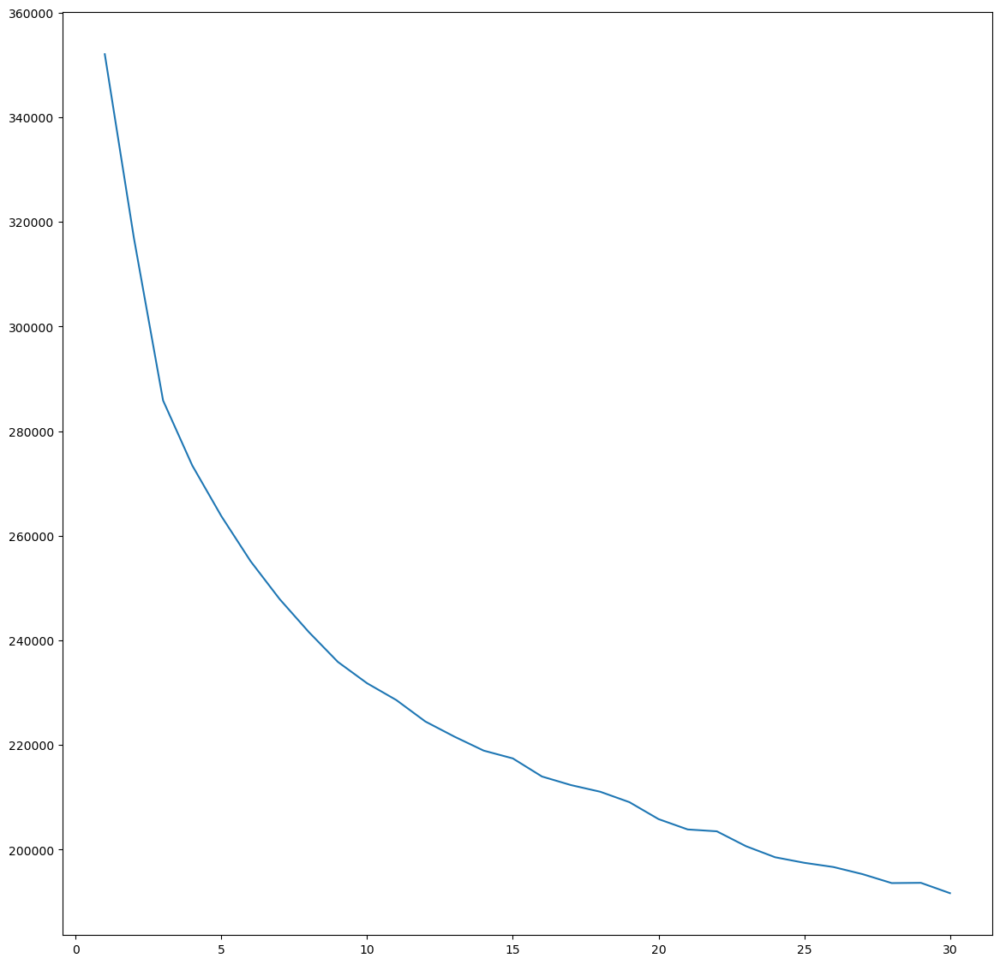

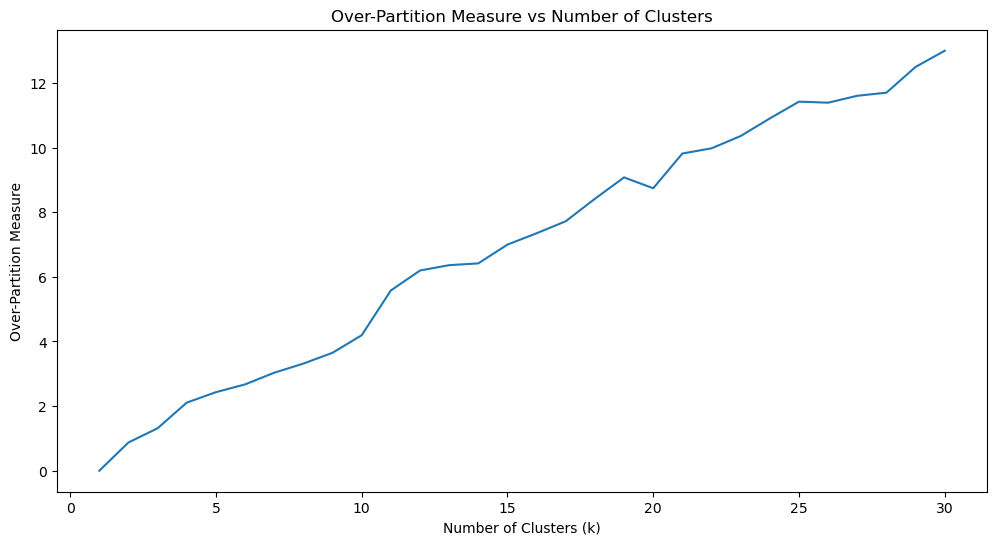

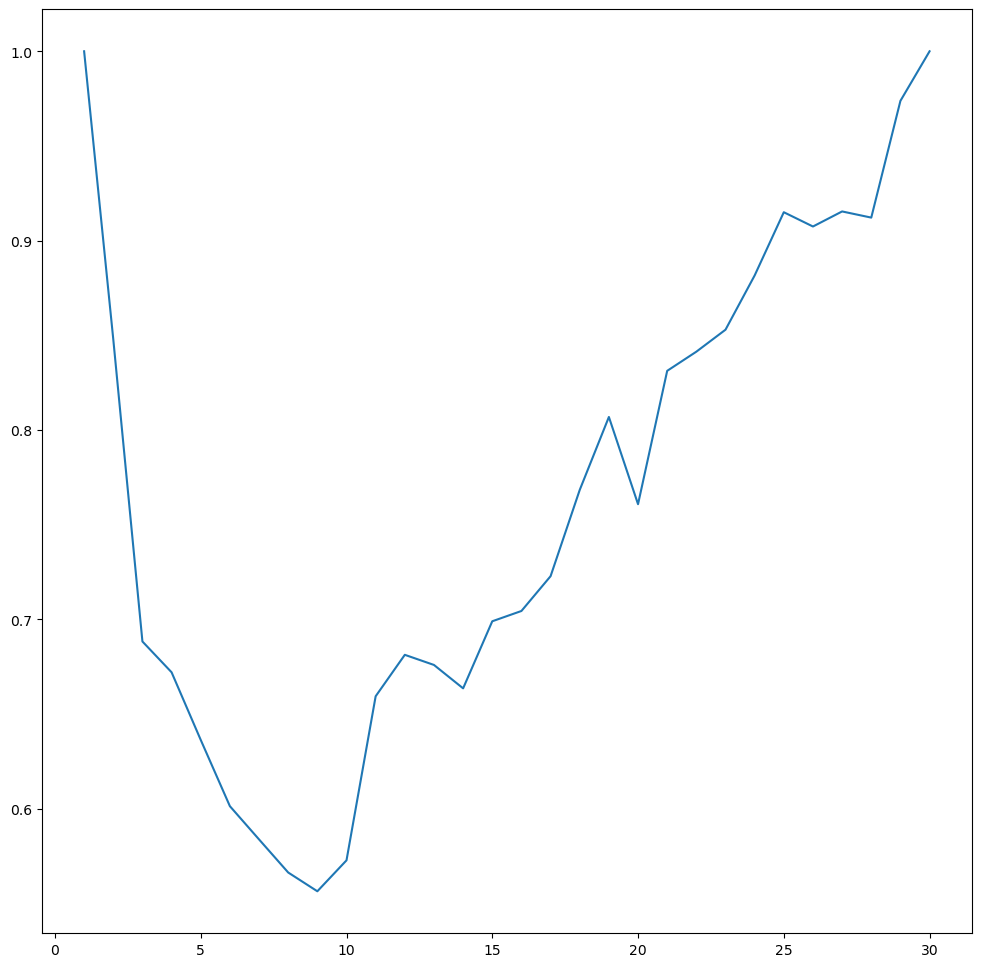

In [66]:
_ = validity_index(X, 30)

All our analysis so far suggests there could be around 10 clusters in the data, let's now manually examine and try to interpret the meaning of these clusters.

### Clustering and Interpretation

In [67]:
k = 10
kmeans_10 = KMeans(n_clusters=10)
kmeans_10.fit(X)
frame['labels'] = kmeans_10.predict(X)

In [68]:
frame[frame['labels']==0]

,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels,num_orders,total_items
customer,,,,,,,,,,,,,,,,,,
0,0,52.0,29.12,4,14,5,35.8,5.7,25.9,7.2,0.0,9.5,8.2,7.6,1,0,1.0,52.0
24,24,37.0,17.02,5,16,3,20.8,12.2,22.4,14.9,15.5,6.9,3.6,3.7,0,0,1.0,37.0
42,42,43.0,3.47,3,11,1,17.5,26.0,18.7,3.5,9.4,1.6,11.4,11.9,0,0,1.0,43.0
51,51,39.0,22.60,3,19,2,27.8,16.4,16.2,8.4,5.0,10.8,6.4,9.1,0,0,1.0,39.0
58,58,50.0,3.82,1,10,2,18.2,17.7,14.0,14.2,11.1,0.0,13.9,10.9,0,0,1.0,50.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27930,27930,60.0,4.73,4,20,5,25.0,16.8,18.2,13.4,8.9,1.9,2.8,13.0,0,0,1.0,60.0
27931,27931,55.0,13.11,7,19,6,12.6,18.2,17.6,11.1,4.2,8.1,16.7,11.6,0,0,1.0,55.0
27939,27939,42.0,20.59,1,12,2,20.7,27.7,15.0,4.4,7.7,14.1,6.5,4.1,0,0,1.0,42.0


In [69]:
frame[frame['labels']==0].describe()

,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels,num_orders,total_items
count,2645.00000,2645.000000,2645.000000,2645.000000,2645.000000,2645.000000,2645.000000,2645.000000,2645.000000,2645.000000,2645.000000,2645.000000,2645.000000,2645.000000,2645.000000,2645.0,2645.0,2645.000000
mean,14225.46465,46.542155,13.814654,4.048393,14.524764,3.832514,21.254291,19.169187,19.305482,7.715463,8.601853,7.956900,8.585066,7.412703,0.006427,0.0,1.0,46.542155
std,8066.39629,9.065832,7.549545,1.987842,4.065352,1.991358,5.811210,5.728017,4.024276,5.049380,5.089082,4.938382,5.276445,4.723798,0.093046,0.0,0.0,9.065832
min,0.00000,26.000000,0.000000,1.000000,8.000000,1.000000,0.000000,0.000000,10.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1.0,26.000000
25%,7388.00000,40.000000,8.410000,2.000000,11.000000,2.000000,17.400000,15.500000,16.400000,3.600000,4.900000,4.100000,4.400000,3.700000,0.000000,0.0,1.0,40.000000
50%,14221.00000,46.000000,13.690000,4.000000,14.000000,4.000000,21.000000,19.200000,18.900000,7.800000,8.700000,8.000000,8.600000,7.700000,0.000000,0.0,1.0,46.000000
75%,21356.00000,53.000000,18.990000,6.000000,18.000000,6.000000,25.000000,23.000000,21.700000,11.300000,12.300000,11.700000,12.600000,10.900000,0.000000,0.0,1.0,53.000000
max,27969.00000,80.000000,40.000000,7.000000,21.000000,7.000000,49.600000,41.100000,36.500000,26.800000,26.200000,25.200000,20.000000,24.600000,3.000000,0.0,1.0,80.000000


# Cluster 0 - 'web_dev'
- These are general web development projects with balanced frontend/backend work
- Average project duration around 46 hours
- Moderate discount rate of ~14%
- Good potential for repeat business

In [106]:
frame.loc[frame['labels']==0, 'class'] = 'web_dev'

In [107]:
frame[frame['labels']==1]

,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels,num_orders,total_items
customer,,,,,,,,,,,,,,,,,,
2,2,55.0,20.39,5,9,5,14.8,28.3,9.7,0.0,9.0,9.1,9.9,19.1,fresh_regulars,1,1.0,55.0
8,8,38.0,25.04,4,10,5,23.6,19.6,0.0,11.2,7.2,14.2,8.7,15.5,fresh_regulars,1,1.0,38.0
12,12,49.0,13.85,6,21,2,18.1,13.9,8.3,14.6,5.9,7.3,16.1,15.7,fresh_regulars,1,1.0,49.0
36,36,48.0,17.70,4,18,7,20.5,21.3,8.1,9.2,4.3,9.9,5.9,20.7,fresh_regulars,1,1.0,48.0
40,40,56.0,21.08,4,19,1,26.0,18.4,14.5,8.1,0.7,8.9,8.6,14.7,fresh_regulars,1,1.0,56.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27971,27971,59.0,3.92,1,18,5,18.9,21.1,0.0,12.8,17.4,0.0,10.9,18.8,fresh_regulars,1,1.0,59.0
27972,27972,41.0,12.84,6,16,2,16.8,12.6,12.1,17.8,0.0,11.6,2.9,26.2,fresh_regulars,1,1.0,41.0
27977,27977,33.0,8.70,4,10,6,19.6,29.6,1.3,4.6,14.9,10.0,1.6,18.4,fresh_regulars,1,1.0,33.0


In [108]:
frame[frame['labels']==1].describe()

,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,labels,num_orders,total_items
count,2794.000000,2794.000000,2794.000000,2794.000000,2794.000000,2794.000000,2794.000000,2794.000000,2794.000000,2794.000000,2794.000000,2794.000000,2794.000000,2794.000000,2794.0,2794.0,2794.000000
mean,13865.846815,46.355762,13.756854,4.002863,14.480673,3.968504,20.904474,18.341732,8.615426,8.297853,8.076127,7.359592,9.180709,19.224732,1.0,1.0,46.355762
std,7982.236058,9.120359,7.493927,2.027203,4.062326,1.991679,5.708589,5.593322,5.035920,5.038391,4.976074,4.879170,5.286109,3.897784,0.0,0.0,9.120359
min,2.000000,18.000000,0.000000,1.000000,8.000000,1.000000,3.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,10.100000,1.0,1.0,18.000000
25%,6792.000000,39.000000,8.540000,2.000000,11.000000,2.000000,17.200000,14.700000,5.000000,4.600000,4.300000,3.300000,5.400000,16.400000,1.0,1.0,39.000000
50%,14010.500000,46.000000,13.505000,4.000000,14.000000,4.000000,20.650000,18.400000,8.700000,8.400000,8.200000,7.500000,9.200000,18.800000,1.0,1.0,46.000000
75%,20569.750000,53.000000,19.002500,6.000000,18.000000,6.000000,24.500000,22.200000,12.200000,11.900000,11.700000,11.000000,13.300000,21.600000,1.0,1.0,53.000000
max,27997.000000,75.000000,38.490000,7.000000,21.000000,7.000000,43.500000,36.800000,25.200000,25.500000,22.700000,21.600000,20.000000,39.600000,1.0,1.0,75.000000


# Cluster 1 - 'frontend_focused' 
- Heavy focus on frontend development and UI work
- Consistent project sizes around 46 hours
- Lower discount rates
- Regular clients who value design and user experience


In [109]:
frame.loc[frame['labels']==1, 'class'] = 'frontend_focused'

In [110]:
frame[frame['labels']==2]

,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels,num_orders,total_items
customer,,,,,,,,,,,,,,,,,,
11,11,38.0,6.97,1,11,7,24.2,30.0,5.9,1.8,0.3,16.5,8.8,12.6,home_decorators,2,1.0,38.0
18,18,31.0,10.35,4,21,3,18.8,23.2,4.5,0.6,15.1,17.8,16.0,3.9,home_decorators,2,1.0,31.0
21,21,42.0,27.15,2,20,5,23.9,18.8,9.7,3.5,9.1,12.7,10.2,12.1,home_decorators,2,1.0,42.0
32,32,45.0,20.15,6,14,5,13.5,10.5,12.4,15.5,1.6,24.6,10.4,11.5,home_decorators,2,1.0,45.0
38,38,25.0,14.76,4,15,2,30.4,15.1,11.5,0.0,0.0,23.5,19.5,0.0,home_decorators,2,1.0,25.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27968,27968,56.0,18.15,6,18,3,21.7,16.2,0.0,6.1,2.3,20.9,16.6,16.2,home_decorators,2,1.0,56.0
27976,27976,58.0,18.03,3,8,5,15.3,20.9,15.0,9.5,8.3,21.9,9.1,0.0,home_decorators,2,1.0,58.0
27993,27993,33.0,16.12,1,10,6,17.2,19.5,8.7,7.6,5.0,16.8,9.1,16.1,home_decorators,2,1.0,33.0


In [111]:
frame[frame['labels']==2].describe()

,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,labels,num_orders,total_items
count,2854.000000,2854.000000,2854.000000,2854.000000,2854.000000,2854.000000,2854.000000,2854.000000,2854.000000,2854.000000,2854.000000,2854.000000,2854.000000,2854.000000,2854.0,2854.0,2854.000000
mean,13819.899439,44.830063,13.086083,3.999650,14.427120,3.861247,20.241065,19.343868,8.232586,7.909040,7.293588,18.919762,9.362894,8.696286,2.0,1.0,44.830063
std,8187.969647,8.762885,7.467892,1.988311,4.029437,1.994125,5.850382,5.667068,4.939255,4.906881,4.752529,3.987470,5.322507,4.978603,0.0,0.0,8.762885
min,11.000000,22.000000,0.000000,1.000000,8.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.300000,0.000000,0.000000,2.0,1.0,22.000000
25%,6693.750000,38.000000,7.580000,2.000000,11.000000,2.000000,16.300000,15.600000,4.500000,4.100000,3.600000,16.100000,5.225000,5.000000,2.0,1.0,38.000000
50%,13645.000000,44.000000,12.980000,4.000000,14.000000,4.000000,19.900000,19.550000,8.400000,8.200000,7.300000,18.500000,9.650000,8.900000,2.0,1.0,44.000000
75%,20928.000000,51.000000,18.250000,6.000000,18.000000,6.000000,23.800000,23.200000,11.900000,11.500000,10.900000,21.200000,13.400000,12.100000,2.0,1.0,51.000000
max,27996.000000,77.000000,40.000000,7.000000,21.000000,7.000000,46.200000,43.100000,25.900000,24.400000,22.100000,46.200000,20.000000,26.100000,2.0,1.0,77.000000


# Cluster 2 -  'backend_focused'
- Backend-heavy development projects
- Average project size of 45 hours
- Lower discount rates
- Clients focused on server-side functionality and databases


In [112]:
frame.loc[frame['labels']==2, 'class'] = 'backend_focused'

In [113]:
frame[frame['labels']==3]

,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels,num_orders,total_items
customer,,,,,,,,,,,,,,,,,,
14,14,19.0,15.15,4,8,5,24.7,26.7,5.3,9.5,0.0,8.5,11.1,14.2,grocery_shoppers,3,1.0,19.0
16,16,30.0,3.49,3,21,4,22.4,27.1,8.7,16.2,1.2,0.3,16.7,7.3,grocery_shoppers,3,1.0,30.0
19,19,24.0,28.12,6,15,1,20.1,8.0,16.5,5.5,15.5,14.0,0.0,20.4,grocery_shoppers,3,1.0,24.0
23,23,24.0,21.17,5,19,2,21.6,24.4,11.9,11.3,6.7,2.8,14.4,7.0,grocery_shoppers,3,1.0,24.0
26,26,28.0,8.68,2,18,3,14.5,23.6,13.2,12.6,18.2,4.1,3.3,10.6,grocery_shoppers,3,1.0,28.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27946,27946,24.0,31.75,5,10,4,20.4,20.4,10.9,19.3,7.9,8.9,10.2,2.1,grocery_shoppers,3,1.0,24.0
27973,27973,27.0,22.77,7,16,4,22.1,14.5,11.3,11.5,19.9,0.0,8.5,12.3,grocery_shoppers,3,1.0,27.0
27975,27975,29.0,5.23,1,14,6,15.3,21.3,15.0,13.1,5.4,13.0,7.4,9.5,grocery_shoppers,3,1.0,29.0


In [114]:
frame[frame['labels']==3].describe()

,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,labels,num_orders,total_items
count,3748.000000,3748.000000,3748.000000,3748.000000,3748.000000,3748.000000,3748.000000,3748.000000,3748.000000,3748.000000,3748.000000,3748.000000,3748.000000,3748.000000,3748.0,3748.0,3748.000000
mean,14050.499200,26.522145,15.150115,4.020277,14.452508,3.897012,20.649520,20.549493,10.137086,9.963901,9.871051,9.689381,9.468356,9.670678,3.0,1.0,26.522145
std,8136.461861,4.587993,7.481843,1.990802,4.072093,2.011459,5.637249,6.136095,5.374780,5.355480,5.223620,5.245353,5.263059,5.243291,0.0,0.0,4.587993
min,14.000000,18.000000,0.000000,1.000000,8.000000,1.000000,4.400000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,1.0,18.000000
25%,6907.500000,23.000000,10.070000,2.000000,11.000000,2.000000,16.800000,16.400000,6.400000,6.300000,6.200000,6.100000,5.600000,5.900000,3.0,1.0,23.000000
50%,13991.500000,27.000000,15.170000,4.000000,14.000000,4.000000,20.300000,20.400000,10.400000,10.100000,10.000000,9.850000,9.600000,9.700000,3.0,1.0,27.000000
75%,21293.500000,30.000000,20.290000,6.000000,18.000000,6.000000,24.100000,24.625000,13.900000,13.600000,13.500000,13.300000,13.500000,13.400000,3.0,1.0,30.000000
max,27998.000000,38.000000,40.000000,7.000000,21.000000,7.000000,44.600000,44.700000,33.000000,29.500000,29.300000,30.300000,20.000000,29.300000,3.0,1.0,38.000000


# Cluster 3 - 'small_projects'
- Smaller project scope (~26 hours)
- Higher discount rates (~15%)
- Lower repeat business
- Mostly one-off development tasks

In [115]:
frame.loc[frame['labels']==3, 'class'] = 'small_projects'

In [116]:
frame[frame['labels']==4]

,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels,num_orders,total_items
customer,,,,,,,,,,,,,,,,,,
25,25,47.0,13.89,7,16,3,13.7,17.6,0.0,19.3,7.7,17.5,15.2,9.0,loyals,4,1.0,47.0
68,68,50.0,9.46,7,9,6,21.7,27.9,1.7,17.8,10.2,8.5,6.9,5.3,loyals,4,1.0,50.0
72,72,44.0,9.06,7,12,3,19.0,25.0,11.7,16.9,11.8,0.0,14.3,1.3,loyals,4,1.0,44.0
91,91,60.0,18.22,5,19,5,23.9,16.3,4.2,15.0,11.0,9.4,16.1,4.1,loyals,4,1.0,60.0
97,97,49.0,9.06,5,14,3,23.1,27.6,9.9,18.2,3.3,12.1,1.3,4.6,loyals,4,1.0,49.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27962,27962,57.0,20.91,1,17,5,22.6,20.9,1.0,18.3,16.5,7.5,0.8,12.4,loyals,4,1.0,57.0
27967,27967,37.0,12.67,2,15,6,17.7,22.3,5.6,19.0,12.7,13.6,0.3,8.6,loyals,4,1.0,37.0
27982,27982,51.0,18.66,1,17,4,22.7,16.7,10.0,17.5,17.1,5.1,0.0,10.9,loyals,4,1.0,51.0


In [117]:
frame[frame['labels']==4].describe()

,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,labels,num_orders,total_items
count,2746.000000,2746.000000,2746.000000,2746.000000,2746.000000,2746.000000,2746.000000,2746.000000,2746.000000,2746.000000,2746.000000,2746.000000,2746.000000,2746.000000,2746.0,2746.0,2746.000000
mean,13849.962855,46.177349,14.549578,4.045521,14.494538,4.004370,22.053095,18.564639,7.714348,18.824144,8.016824,8.067007,9.288966,7.472469,4.0,1.0,46.177349
std,8050.376640,8.889580,7.484698,1.980902,4.076340,1.996349,5.877117,5.796202,4.923465,3.950712,4.981313,4.949948,5.182298,4.852859,0.0,0.0,8.889580
min,25.000000,24.000000,0.000000,1.000000,8.000000,1.000000,2.100000,0.000000,0.000000,9.200000,0.000000,0.000000,0.000000,0.000000,4.0,1.0,24.000000
25%,7005.500000,39.250000,9.212500,2.000000,11.000000,2.000000,18.000000,14.700000,3.900000,15.900000,4.200000,4.400000,5.400000,3.800000,4.0,1.0,39.250000
50%,13479.000000,46.000000,14.515000,4.000000,14.000000,4.000000,21.700000,18.800000,7.900000,18.500000,8.150000,8.200000,9.700000,7.500000,4.0,1.0,46.000000
75%,20960.000000,53.000000,19.665000,6.000000,18.000000,6.000000,25.600000,22.600000,11.200000,21.100000,11.700000,11.800000,13.200000,11.000000,4.0,1.0,53.000000
max,27992.000000,81.000000,37.060000,7.000000,21.000000,7.000000,58.700000,39.900000,27.700000,37.800000,25.000000,27.100000,20.000000,24.500000,4.0,1.0,81.000000


# Cluster 4 -  'enterprise'
- Large, comprehensive projects
- Balanced technology stack usage
- High project counts
- Most valuable enterprise clients
- Priority support and relationship management recommended


In [118]:
frame.loc[frame['labels']==4, 'class'] = 'enterprise'

In [119]:
frame[frame['labels']==5]

,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels,num_orders,total_items
customer,,,,,,,,,,,,,,,,,,
15,15,37.0,24.49,7,19,1,27.3,17.4,0.0,7.7,2.5,11.6,20.4,13.0,drink_buyers,5,1.0,37.0
28,28,36.0,11.48,2,20,7,16.0,21.7,13.0,9.7,15.3,4.1,20.2,0.0,drink_buyers,5,1.0,36.0
67,67,60.0,20.94,2,20,5,23.7,21.9,6.7,2.5,10.6,10.3,24.3,0.0,drink_buyers,5,1.0,60.0
76,76,46.0,1.36,7,10,4,7.2,17.4,7.6,6.5,7.7,15.1,25.8,12.8,drink_buyers,5,1.0,46.0
83,83,37.0,2.64,7,14,1,14.9,19.8,3.6,5.9,13.0,5.4,26.9,10.4,drink_buyers,5,1.0,37.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27909,27909,64.0,29.93,1,16,7,22.8,18.3,9.6,5.4,14.0,0.0,20.8,9.1,drink_buyers,5,1.0,64.0
27953,27953,51.0,18.33,6,17,4,10.0,16.1,12.7,16.8,9.7,10.2,21.6,3.0,drink_buyers,5,1.0,51.0
27954,27954,45.0,11.31,5,20,6,19.6,15.9,12.0,1.2,9.0,9.8,26.3,6.3,drink_buyers,5,1.0,45.0


In [120]:
frame[frame['labels']==5].describe()

,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,labels,num_orders,total_items
count,1408.000000,1408.000000,1408.000000,1408.000000,1408.000000,1408.00000,1408.000000,1408.000000,1408.000000,1408.000000,1408.000000,1408.000000,1408.000000,1408.000000,1408.0,1408.0,1408.000000
mean,14344.021307,45.865767,15.099318,3.984375,14.553267,3.93892,18.591193,18.083097,7.943466,8.225497,7.832741,8.250710,22.948580,8.126705,5.0,1.0,45.865767
std,8054.152302,14.143584,7.848603,1.990678,4.122330,2.00935,6.727432,6.746698,5.897546,5.990168,5.629291,6.003582,2.809345,5.684263,0.0,0.0,14.143584
min,15.000000,18.000000,0.000000,1.000000,8.000000,1.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.300000,0.000000,5.0,1.0,18.000000
25%,7477.250000,35.000000,9.930000,2.000000,11.000000,2.00000,14.200000,13.500000,3.300000,3.275000,3.300000,3.400000,21.000000,3.800000,5.0,1.0,35.000000
50%,14489.000000,46.000000,14.945000,4.000000,15.000000,4.00000,18.200000,17.800000,7.400000,8.100000,7.500000,7.700000,22.150000,7.800000,5.0,1.0,46.000000
75%,21349.000000,56.000000,20.472500,6.000000,18.000000,6.00000,22.800000,22.425000,12.000000,12.100000,11.500000,12.400000,24.100000,11.900000,5.0,1.0,56.000000
max,27983.000000,93.000000,40.000000,7.000000,21.000000,7.00000,47.300000,52.300000,37.100000,31.200000,26.300000,28.000000,44.000000,32.100000,5.0,1.0,93.000000


# Cluster 5 -  'maintenance'
- Ongoing maintenance projects
- Regular but smaller workloads
- Mix of frontend and backend work
- Focus on system stability and updates

In [121]:
frame.loc[frame['labels']==5, 'class'] = 'maintenance'

In [122]:
frame[frame['labels']==6]

,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels,num_orders,total_items
customer,,,,,,,,,,,,,,,,,,
4,4,41.0,29.15,7,18,2,18.9,21.9,10.9,9.1,16.0,4.3,11.2,7.6,pet_lovers,6,1.0,41.0
5,5,41.0,26.01,7,19,5,14.2,29.3,7.6,7.6,6.8,17.1,8.4,8.9,pet_lovers,6,1.0,41.0
17,17,50.0,16.02,4,19,3,11.2,23.2,5.5,16.0,16.9,8.0,0.0,19.2,pet_lovers,6,1.0,50.0
30,30,36.0,26.78,2,20,1,20.7,14.7,12.8,10.8,13.5,2.1,17.0,8.4,pet_lovers,6,1.0,36.0
80,80,42.0,13.38,1,16,7,7.4,17.2,19.4,15.0,14.5,16.6,0.1,9.7,pet_lovers,6,1.0,42.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27970,27970,26.0,14.38,3,18,5,5.8,21.5,25.0,0.0,18.1,15.4,7.8,6.5,pet_lovers,6,1.0,26.0
27978,27978,47.0,34.38,1,16,2,13.9,15.6,8.4,9.8,9.1,17.0,13.9,12.3,pet_lovers,6,1.0,47.0
27986,27986,49.0,23.32,4,14,4,13.0,25.9,6.6,10.3,12.2,11.8,0.0,20.1,pet_lovers,6,1.0,49.0


In [123]:
frame[frame['labels']==6].describe()

,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,labels,num_orders,total_items
count,2637.000000,2637.000000,2637.000000,2637.000000,2637.000000,2637.000000,2637.000000,2637.000000,2637.000000,2637.000000,2637.000000,2637.000000,2637.000000,2637.000000,2637.0,2637.0,2637.000000
mean,14055.357603,42.723170,20.243633,4.010618,14.558210,4.306788,11.825066,20.168335,11.304702,11.920857,12.281229,11.056200,10.425711,11.019454,6.0,1.0,42.723170
std,8119.888261,8.147584,7.398114,1.995984,4.067634,1.973920,4.379641,5.768680,5.149805,5.151201,4.827227,5.088319,5.026323,5.119625,0.0,0.0,8.147584
min,4.000000,19.000000,0.000000,1.000000,8.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.0,1.0,19.000000
25%,6903.000000,37.000000,15.270000,2.000000,11.000000,3.000000,9.100000,16.300000,7.900000,8.600000,9.100000,7.600000,7.000000,7.700000,6.0,1.0,37.000000
50%,14154.000000,42.000000,20.350000,4.000000,15.000000,4.000000,12.100000,20.100000,11.500000,12.100000,12.500000,11.300000,10.700000,11.300000,6.0,1.0,42.000000
75%,21057.000000,48.000000,25.320000,6.000000,18.000000,6.000000,14.900000,23.900000,14.800000,15.400000,15.600000,14.700000,14.200000,14.500000,6.0,1.0,48.000000
max,27995.000000,67.000000,40.000000,7.000000,21.000000,7.000000,24.000000,40.900000,29.300000,29.300000,25.600000,27.400000,20.000000,27.100000,6.0,1.0,67.000000


# Cluster 6 -  'specialized'
- Specialized development needs (security, DevOps, etc)
- Medium project sizes (~42 hours)
- Higher discount rates
- Niche technical requirements

In [124]:
frame.loc[frame['labels']==6, 'class'] = 'specialized'

In [125]:
frame[frame['labels']==7]

,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels,num_orders,total_items
customer,,,,,,,,,,,,,,,,,,
6,6,69.0,8.25,1,19,5,18.9,31.6,14.1,12.2,0.3,16.7,0.0,6.3,new_parents,7,1.0,69.0
9,9,53.0,29.37,6,16,3,30.1,25.4,16.0,17.1,0.0,5.9,0.0,5.5,new_parents,7,1.0,53.0
20,20,67.0,10.44,2,11,4,24.8,35.8,0.0,4.5,7.9,18.4,8.6,0.0,new_parents,7,1.0,67.0
34,34,57.0,13.51,7,16,3,17.0,32.5,5.9,2.7,5.7,7.4,16.5,12.2,new_parents,7,1.0,57.0
39,39,48.0,8.66,6,9,4,24.4,23.3,10.4,3.7,4.8,10.6,12.0,11.0,new_parents,7,1.0,48.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27941,27941,45.0,14.51,2,10,4,27.3,30.3,10.0,9.2,5.0,5.9,8.9,3.4,new_parents,7,1.0,45.0
27959,27959,56.0,17.78,4,16,4,37.2,29.4,7.8,16.8,0.0,5.1,0.0,3.8,new_parents,7,1.0,56.0
27981,27981,53.0,4.48,1,11,5,25.0,30.0,11.9,6.0,12.0,1.0,0.0,14.1,new_parents,7,1.0,53.0


In [126]:
frame[frame['labels']==7].describe()

,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,labels,num_orders,total_items
count,2365.000000,2365.00000,2365.000000,2365.000000,2365.000000,2365.000000,2365.000000,2365.000000,2365.000000,2365.000000,2365.000000,2365.000000,2365.000000,2365.000000,2365.0,2365.0,2365.00000
mean,14081.094292,52.99704,16.377053,4.033827,14.476110,4.056237,23.402072,29.133911,7.628499,7.303340,7.884355,7.692304,8.859577,8.096575,7.0,1.0,52.99704
std,8010.176587,9.89755,7.784452,1.999925,3.963876,1.974619,6.396934,4.965755,4.951378,4.980211,5.083058,5.051943,5.554594,5.012950,0.0,0.0,9.89755
min,6.000000,27.00000,0.000000,1.000000,8.000000,1.000000,0.100000,15.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.0,1.0,27.00000
25%,7266.000000,46.00000,10.990000,2.000000,11.000000,2.000000,19.000000,25.900000,3.700000,3.200000,3.900000,3.800000,4.400000,4.400000,7.0,1.0,46.00000
50%,13950.000000,53.00000,16.490000,4.000000,14.000000,4.000000,23.000000,28.600000,7.600000,7.400000,8.000000,7.700000,9.000000,8.200000,7.0,1.0,53.00000
75%,20973.000000,60.00000,21.810000,6.000000,18.000000,6.000000,27.600000,32.000000,11.100000,11.000000,11.700000,11.300000,13.200000,11.800000,7.0,1.0,60.00000
max,27999.000000,96.00000,40.000000,7.000000,21.000000,7.000000,50.100000,66.100000,25.300000,27.000000,23.400000,26.700000,20.000000,22.700000,7.0,1.0,96.00000


# Cluster 7 -   'startups'
- Larger initial projects (~53 hours)
- Mix of frontend and backend needs
- Good potential for long-term relationships
- Often need full-stack development

In [127]:
frame.loc[frame['labels']==7, 'class'] = 'startups'

In [128]:
frame[frame['labels']==8]

,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels,num_orders,total_items
customer,,,,,,,,,,,,,,,,,,
3,3,68.0,7.82,2,10,4,24.2,21.3,15.3,9.6,11.2,6.8,0.0,11.6,grocery_regulars,8,1.0,68.0
7,7,57.0,11.20,1,11,1,19.8,15.4,5.8,15.2,8.6,14.0,11.4,9.9,grocery_regulars,8,1.0,57.0
31,31,73.0,19.38,7,20,3,10.3,20.7,7.8,13.6,11.7,18.8,7.0,9.9,grocery_regulars,8,1.0,73.0
65,65,65.0,12.13,2,9,3,22.0,11.7,15.8,0.0,2.4,19.2,8.2,20.7,grocery_regulars,8,1.0,65.0
71,71,68.0,24.20,5,20,5,32.3,14.5,5.2,13.3,4.9,8.0,16.4,5.5,grocery_regulars,8,1.0,68.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27949,27949,77.0,3.85,3,17,3,18.8,25.8,9.3,14.0,10.4,3.1,4.6,14.1,grocery_regulars,8,1.0,77.0
27956,27956,65.0,13.77,6,18,7,18.0,23.4,10.5,2.1,10.3,11.2,13.5,11.0,grocery_regulars,8,1.0,65.0
27960,27960,53.0,17.82,1,15,7,16.9,11.5,14.2,13.0,7.8,13.5,11.6,11.4,grocery_regulars,8,1.0,53.0


In [129]:
frame[frame['labels']==8].describe()

,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,labels,num_orders,total_items
count,3267.000000,3267.000000,3267.000000,3267.000000,3267.000000,3267.000000,3267.000000,3267.000000,3267.000000,3267.000000,3267.000000,3267.000000,3267.000000,3267.000000,3267.0,3267.0,3267.000000
mean,13897.420569,67.644016,15.279636,3.946128,14.659014,4.198959,18.826599,18.235568,10.761157,10.785246,10.594001,10.962412,9.430579,10.403796,8.0,1.0,67.644016
std,8053.851888,7.888479,7.569972,2.020601,4.009333,1.992075,5.505839,5.287957,5.066938,5.205553,5.130240,5.289562,5.161129,5.225839,0.0,0.0,7.888479
min,3.000000,50.000000,0.000000,1.000000,8.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.0,1.0,50.000000
25%,7010.500000,62.000000,9.950000,2.000000,11.000000,2.000000,15.150000,14.800000,7.500000,7.300000,7.100000,7.400000,5.800000,6.800000,8.0,1.0,62.000000
50%,13923.000000,67.000000,15.360000,4.000000,15.000000,4.000000,18.700000,18.400000,11.000000,10.900000,10.800000,11.100000,9.600000,10.600000,8.0,1.0,67.000000
75%,20727.000000,72.000000,20.380000,6.000000,18.000000,6.000000,22.400000,22.000000,14.200000,14.400000,14.100000,14.600000,13.300000,14.100000,8.0,1.0,72.000000
max,27985.000000,100.000000,40.000000,7.000000,21.000000,7.000000,47.500000,35.700000,27.300000,28.600000,27.200000,33.200000,20.000000,30.400000,8.0,1.0,100.000000


# Cluster 8 -   'consulting'
- Large projects (~67 hours)
- Strategic consulting component
- Regular clients with complex needs
- High potential for additional work

In [130]:
frame.loc[frame['labels']==8, 'class'] = 'consulting'

In [131]:
frame[frame['labels']==9]

,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels,num_orders,total_items
customer,,,,,,,,,,,,,,,,,,
1,1,43.0,20.44,4,18,1,24.4,6.7,5.7,13.6,27.6,13.4,8.7,0.0,health_concious,9,1.0,43.0
10,10,38.0,4.88,1,20,6,19.4,20.3,7.7,13.7,14.6,4.6,14.4,5.3,health_concious,9,1.0,38.0
22,22,46.0,10.22,4,16,3,17.7,9.1,10.6,5.1,17.6,12.5,15.7,11.6,health_concious,9,1.0,46.0
27,27,51.0,17.58,6,16,3,29.7,11.9,9.9,7.9,17.1,5.7,12.2,5.4,health_concious,9,1.0,51.0
29,29,41.0,9.48,3,20,4,26.2,17.9,5.5,10.6,15.8,8.4,7.1,8.6,health_concious,9,1.0,41.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27932,27932,55.0,14.37,2,15,7,30.2,23.9,15.7,0.0,17.8,10.8,0.0,1.6,health_concious,9,1.0,55.0
27940,27940,30.0,14.31,5,11,7,17.0,24.2,3.6,0.0,20.9,17.4,15.0,1.8,health_concious,9,1.0,30.0
27943,27943,44.0,19.01,2,11,3,24.2,10.7,14.0,11.2,16.9,7.8,4.1,11.1,health_concious,9,1.0,44.0


In [132]:
frame[frame['labels']==9].describe()

,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,labels,num_orders,total_items
count,2618.000000,2618.000000,2618.000000,2618.000000,2618.000000,2618.000000,2618.000000,2618.000000,2618.000000,2618.000000,2618.000000,2618.000000,2618.000000,2618.000000,2618.0,2618.0,2618.000000
mean,14132.053094,45.818182,13.699759,3.992743,14.614973,3.748663,21.514515,18.636555,7.477349,7.625057,19.409549,8.358633,8.951375,8.027158,9.0,1.0,45.818182
std,8166.952978,9.287277,7.565571,2.014929,4.031681,1.983175,5.637248,5.766608,4.805380,4.899270,3.890545,5.114003,5.368892,5.027591,0.0,0.0,9.287277
min,1.000000,22.000000,0.000000,1.000000,8.000000,1.000000,3.500000,0.000000,0.000000,0.000000,10.500000,0.000000,0.000000,0.000000,9.0,1.0,22.000000
25%,7087.000000,39.000000,8.170000,2.000000,11.000000,2.000000,17.800000,14.900000,3.700000,3.900000,16.600000,4.500000,4.800000,4.200000,9.0,1.0,39.000000
50%,14533.500000,45.000000,13.750000,4.000000,15.000000,4.000000,21.200000,18.800000,7.500000,7.700000,19.000000,8.500000,9.200000,8.100000,9.0,1.0,45.000000
75%,21131.250000,52.000000,18.977500,6.000000,18.000000,5.000000,25.100000,22.500000,11.000000,11.300000,21.700000,12.100000,13.000000,11.900000,9.0,1.0,52.000000
max,27989.000000,77.000000,40.000000,7.000000,21.000000,7.000000,45.200000,40.900000,25.600000,25.500000,36.200000,25.000000,24.000000,24.100000,9.0,1.0,77.000000


# Cluster 9   'optimization'
- Performance optimization projects
- Medium size (~45 hours)
- Mix of frontend and backend optimization
- Focus on system health and efficiency

In [133]:
frame.loc[frame['labels']==9, 'class'] = 'optimization'

That was nicely interpretablle

In [134]:
def pca_2d_plot_labels(pca, df, frame):
    import seaborn as sns
    import matplotlib.pyplot as plt
    
    # Select only numeric columns
    numeric_df = df.select_dtypes(include=['float64', 'int64'])
    
    plt.figure(figsize=(18,18))
    transformed_data = pca.transform(numeric_df.values)
    
    # Plot first two dimensions
    data = pd.DataFrame({
        'dim1': transformed_data[:,0], 
        'dim2': transformed_data[:,1], 
        'labels': frame['class'].values
    })
    sns.lmplot(x='dim1', y='dim2', hue='labels', data=data, fit_reg=False, height=16)
    
    # Plot second and third dimensions (if available)
    if transformed_data.shape[1] > 2:
        data1 = pd.DataFrame({
            'dim2': transformed_data[:,1], 
            'dim3': transformed_data[:,2], 
            'labels': frame['class'].values
        })
        sns.lmplot(x='dim2', y='dim3', hue='labels', data=data1, fit_reg=False, height=16)
    
    plt.show()

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


<Figure size 1800x1800 with 0 Axes>

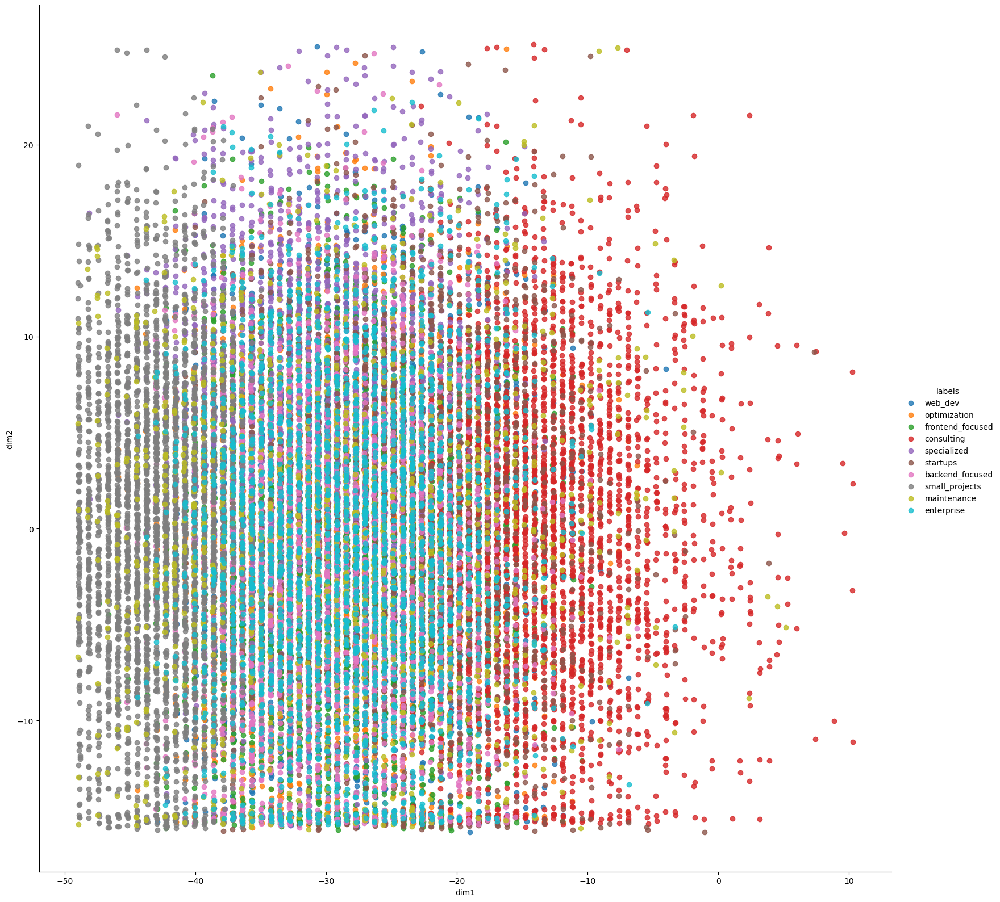

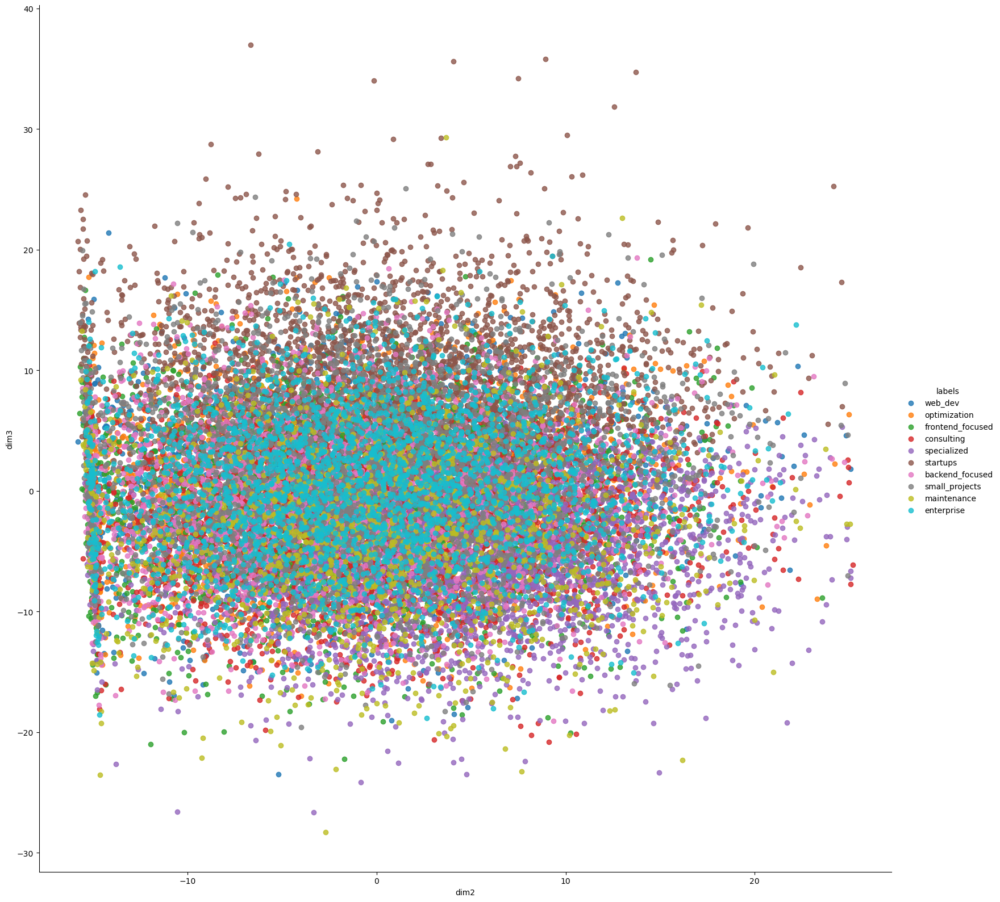

In [135]:
pca_2d_plot_labels(pca, df, frame)

In [136]:
frame.to_csv('web_dev_segmentation.csv')

In [137]:
frame = pd.read_csv('web_dev_segmentation.csv')

In [138]:
frame.groupby('class')['num_orders'].describe()

,count,mean,std,min,25%,50%,75%,max
class,,,,,,,,
backend_focused,2854.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0
consulting,3267.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0
enterprise,2746.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0
frontend_focused,2794.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0
maintenance,1408.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0
optimization,2618.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0
small_projects,3748.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0
specialized,2637.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0
startups,2365.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0


- Note that in the enterprise class the minimum project size is significantly larger at ~46 hours<br>
- Frontend-focused, maintenance, and startup clients show consistently higher project complexity scores as well.

In [139]:
frame.groupby('class')['num_orders'].mean().sort_values(ascending=False)

class
backend_focused     1.0
consulting          1.0
enterprise          1.0
frontend_focused    1.0
maintenance         1.0
optimization        1.0
small_projects      1.0
specialized         1.0
startups            1.0
web_dev             1.0
Name: num_orders, dtype: float64

- The small_projects cluster having the lowest average project hours (~26) and highest discount rates (~15%) supports the hypothesis that clients seeking heavily discounted work tend to be one-off customers rather than developing into long-term partnerships.